### EE5178:Modern Computer Vision 
#### PA2: Programming Assignment- Edge Detection
##### DA24M006 GAURAV KUMAR

Not all edges are equally important to the human eye. \
For segmentation, we need to detect images through edges that humans perceive as important.\
The Berkeley ComputerVision group has an annotated dataset Berkeley Segmentation Data Set and Benchmarks 500 (BSDS500).\
The goal of this assignment is to build a deep learning network that works for edge detection on this dataset.


**Importing Library**

In [2]:

import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import cv2
from scipy.io import loadmat
from PIL import Image
import glob
from sklearn.metrics import precision_recall_curve
from tqdm import tqdm

#### Task 1: Canny Edge Detection

  First, download the dataset and write a canny edge detection algorithm to        extract edges. \
  Use different values of the blurring parameter to see how close you can          get to the ground-truth edges. \
  Your answer should contain plots of the image, ground truth and canny            output for various values of blurring parameter.\
  Does the canny detector work well for edge detection? Why/Why not?

##### (i) Setting the Dataset directory for Berkeley Segmentation Data Set and Benchmarks 500(BSDS500)

In [3]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


DATA_ROOT = '/kaggle/input/pa2-bsds500'
TRAIN_IMG_DIR = os.path.join(DATA_ROOT, 'train/images')
TRAIN_GT_DIR = os.path.join(DATA_ROOT, 'train/groundTruth')
VAL_IMG_DIR = os.path.join(DATA_ROOT, 'val/images')
VAL_GT_DIR = os.path.join(DATA_ROOT, 'val/groundTruth')
TEST_IMG_DIR = os.path.join(DATA_ROOT, 'test/images')
TEST_GT_DIR = os.path.join(DATA_ROOT, 'test/groundTruth')

class BSDS500Dataset(Dataset):
    def __init__(self, img_dir, gt_dir, transform=None, target_size=(320, 320)):
        self.img_dir = img_dir
        self.gt_dir = gt_dir
        self.transform = transform
        self.target_size = target_size  # Ensure all images and GT masks are the same size
        
        self.img_paths = sorted(glob.glob(os.path.join(img_dir, "*.jpg")))
        
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        # Load image
        img_path = self.img_paths[idx]
        image = Image.open(img_path).convert('RGB')
        
        # Extract image filename without extension
        img_name = os.path.basename(img_path).split('.')[0]
        
        # Load ground truth edges from .mat file
        gt_path = os.path.join(self.gt_dir, img_name + '.mat')
        gt_data = loadmat(gt_path)
        
        # Extract first ground truth annotation
        gt_boundaries = gt_data['groundTruth'][0, 0]['Boundaries'][0, 0]
        gt_boundaries = torch.from_numpy(gt_boundaries.astype(np.float32))

        # Resize image and GT mask to fixed size
        image = image.resize(self.target_size, Image.BILINEAR)
        gt_boundaries = transforms.functional.resize(gt_boundaries.unsqueeze(0), self.target_size, interpolation=transforms.InterpolationMode.NEAREST).squeeze(0)

        # Apply transforms
        if self.transform:
            image = self.transform(image)

        return image, gt_boundaries, img_name

Using device: cuda


##### (ii) Class balanced cross entropy loss function and Edge Visualize function

In [4]:
# Function to visualize results
def visualize_edges(image, gt_edges, predicted_edges, title="Edge Detection Comparison"):
    """
    Visualize original image, ground truth edges, and predicted edges side by side
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Plot original image
    if isinstance(image, torch.Tensor):
        # Convert tensor to numpy and denormalize if needed
        if image.shape[0] == 3:  # If image is in CHW format
            img_np = image.permute(1, 2, 0).cpu().numpy()
            # Denormalize if image was normalized during transform
            img_np = np.clip(img_np * np.array([0.229, 0.224, 0.225]) + 
                            np.array([0.485, 0.456, 0.406]), 0, 1)
        else:
            img_np = image.cpu().numpy()
    else:
        img_np = image
        
    axes[0].imshow(img_np)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    # Plot ground truth edges
    if isinstance(gt_edges, torch.Tensor):
        gt_np = gt_edges.squeeze().cpu().numpy()
    else:
        gt_np = gt_edges
    axes[1].imshow(gt_np, cmap='gray')
    axes[1].set_title("Ground Truth Edges")
    axes[1].axis('off')
    
    # Plot predicted edges
    if isinstance(predicted_edges, torch.Tensor):
        pred_np = predicted_edges.squeeze().cpu().numpy()
    else:
        pred_np = predicted_edges
    axes[2].imshow(pred_np, cmap='gray')
    axes[2].set_title("Predicted Edges")
    axes[2].axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    return fig

# Class balanced cross entropy loss as described in HED paper
class BalancedCrossEntropyLoss(nn.Module):
    def __init__(self):
        super(BalancedCrossEntropyLoss, self).__init__()
        
    def forward(self, prediction, target):
        """
        Args:
            prediction: Tensor of shape [batch_size, 1, height, width]
            target: Tensor of shape [batch_size, 1, height, width]
        Returns:
            Balanced cross entropy loss
        """
        # Flatten prediction and target
        prediction = prediction.view(-1)
        target = target.view(-1)
        
        # Calculate positive and negative weights
        beta = torch.sum(target) / target.numel()  # Positive ratio
        
        # Avoid division by zero
        beta = torch.clamp(beta, min=0.01, max=0.99)
        
        # Positive weight (1-beta) and negative weight (beta)
        weights = torch.ones_like(target)
        weights[target > 0.5] = 1 - beta
        weights[target <= 0.5] = beta
        
        # Binary cross entropy loss
        loss = nn.functional.binary_cross_entropy_with_logits(
            prediction, target, weight=weights, reduction='mean'
        )
        
        return loss

 ##### (iii) Canny Edge Detection with different sigma values for Gaussian blur.
 
 

Task 1: Canny Edge Detection


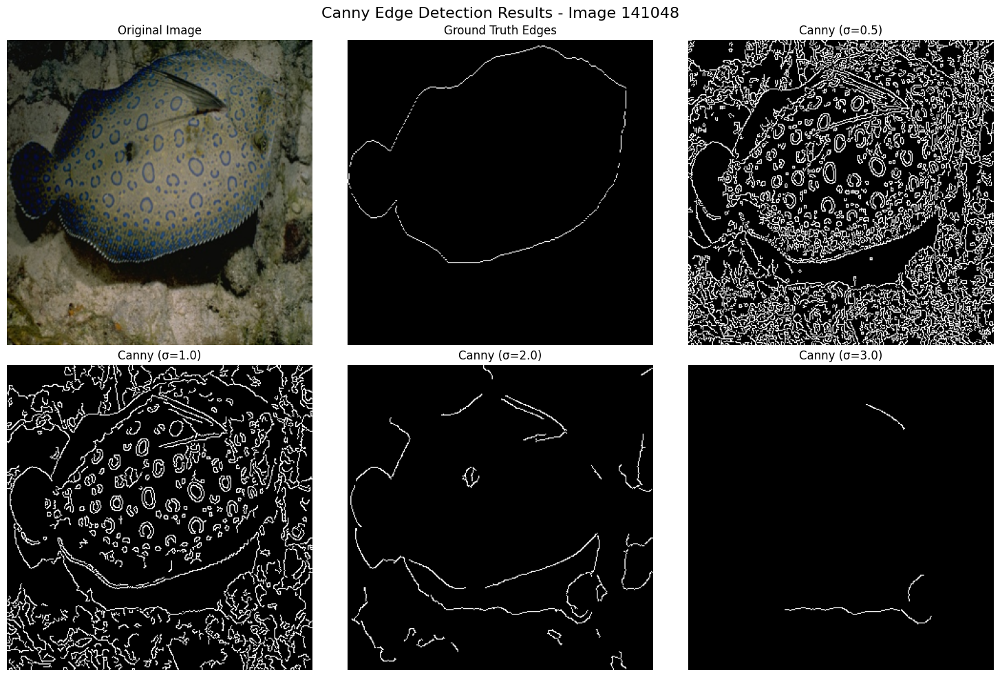

Processed image 141048


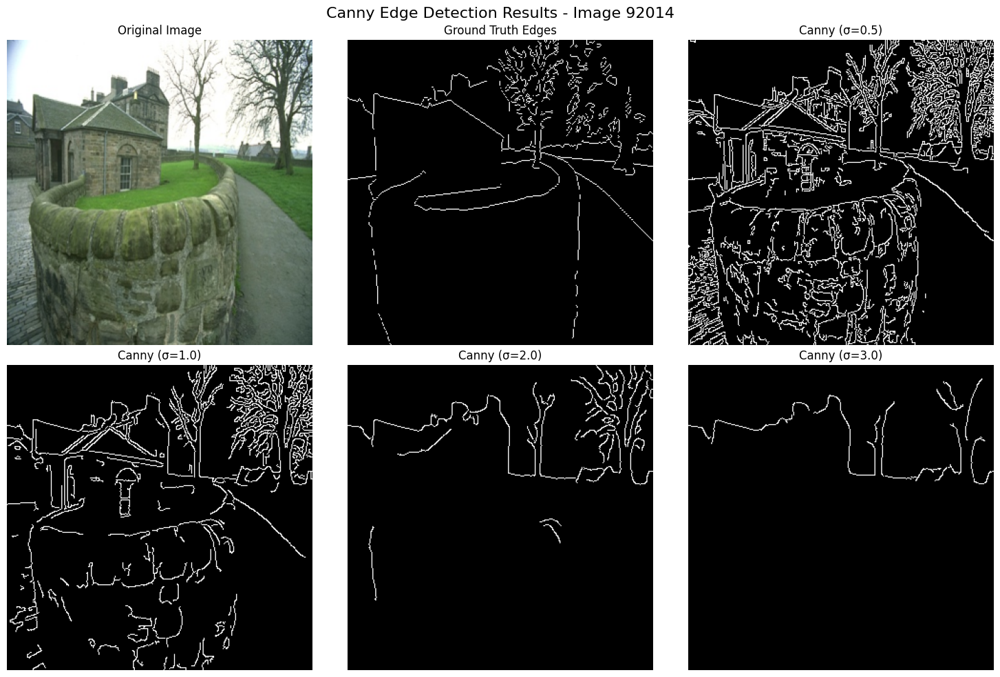

Processed image 92014


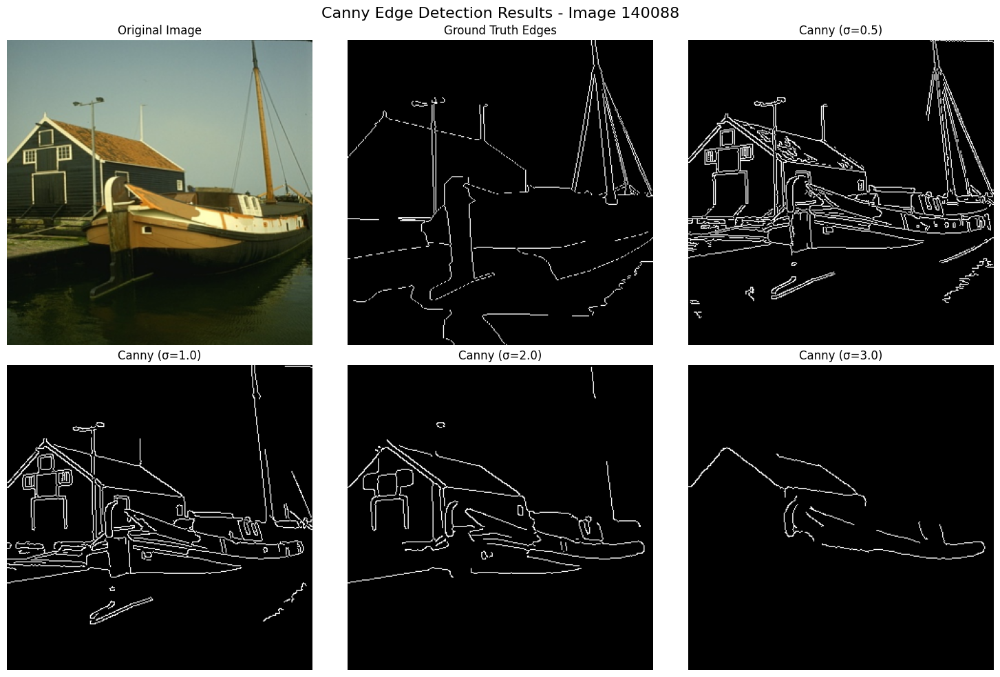

Processed image 140088


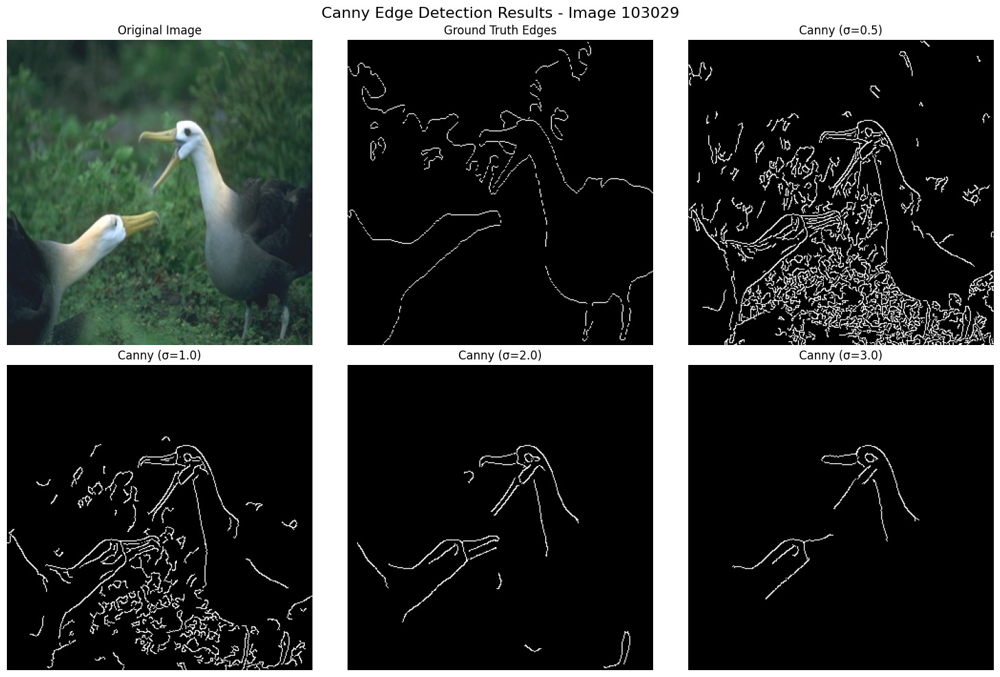

Processed image 103029


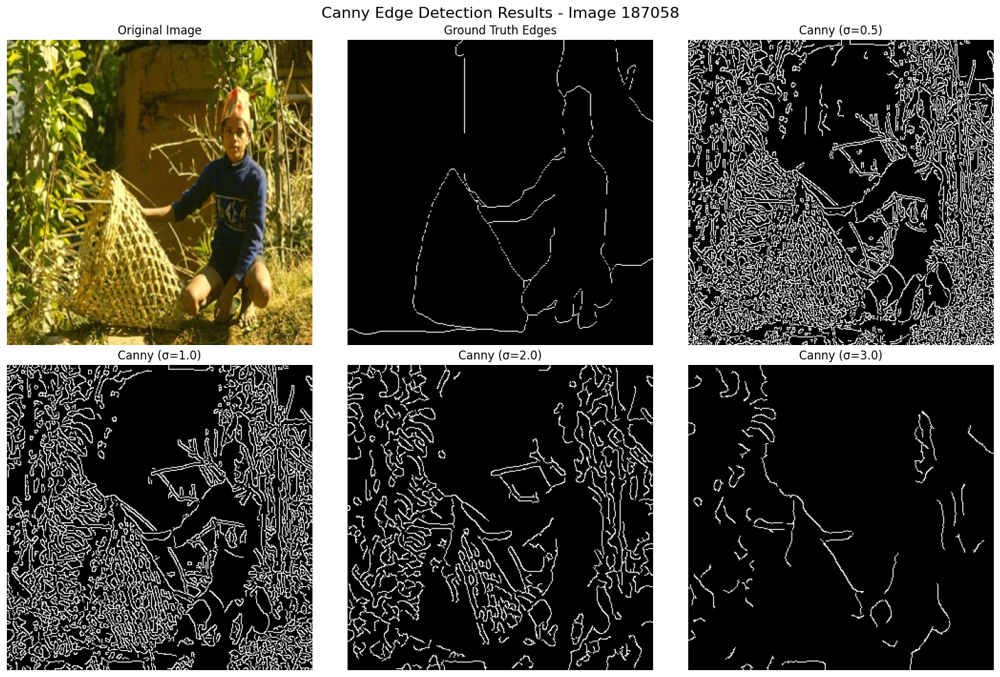

Processed image 187058
Task 1 completed. Discussion points:
1. Canny's performance varies with sigma 0.5,1.0,2.0.and 3 (blur ammount) 
2. Weaknesses of Canny edge detection include:
   - It detects all edges, not just perceptually important ones
   - Parameter tuning is required for each image
   - It lacks semantic understanding of the image content
   - Results depend heavily on image contrast and noise


In [5]:
def task1_canny_edge_detection():
    """
    Task 1: Implement Canny edge detection and compare with ground truth
    """
    print("Task 1: Canny Edge Detection")
    
    # Set up transforms for loading images
    transform = transforms.Compose([
        transforms.Resize((320, 320)),  # Common size for BSDS500
        transforms.ToTensor(),
    ])
    
    # Create test dataset
    test_dataset = BSDS500Dataset(TEST_IMG_DIR, TEST_GT_DIR, transform=transform)
    
    # Test different sigma values for Gaussian blur
    sigma_values = [0.5,1.0,2.0,3.0]
    
    # Process a few sample images
    num_samples = 5
    sample_indices = np.random.choice(len(test_dataset), num_samples, replace=False)
    
    for idx in sample_indices:
        image, gt_edges, img_name = test_dataset[idx]
        
        # Convert PyTorch tensor to numpy array for OpenCV processing
        img_np = (image.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
        
        # Convert to grayscale for edge detection
        gray_img = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
        
        # Create figure for all sigma values
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # Plot original image
        axes[0, 0].imshow(img_np)
        axes[0, 0].set_title("Original Image")
        axes[0, 0].axis('off')
        
        # Plot ground truth
        gt_np = gt_edges.squeeze().numpy()
        axes[0, 1].imshow(gt_np, cmap='gray')
        axes[0, 1].set_title("Ground Truth Edges")
        axes[0, 1].axis('off')
        
        # Plot Canny edges for different sigma values
        ax_idx = 2
        for i, sigma in enumerate(sigma_values):
            if i < 1:  # First 1 results go in the first row
                row, col = 0, ax_idx
            elif i< 4:  # Last result goes in the second row
                row, col = 1, ax_idx
            else:
                row, col =2,ax_idx
                
            # Apply Gaussian blur with current sigma
            blurred = cv2.GaussianBlur(gray_img, (0, 0), sigma)
            
            # Apply Canny edge detection
            # We'll use automatic threshold calculation
            median_value = np.median(blurred)
            lower_threshold = int(max(0, (1.0 - 0.33) * median_value))
            upper_threshold = int(min(255, (1.0 + 0.33) * median_value))
            
            canny_edges = cv2.Canny(blurred, lower_threshold, upper_threshold)
            
            # Plot the result
            axes[row, col].imshow(canny_edges, cmap='gray')
            axes[row, col].set_title(f"Canny (σ={sigma})")
            axes[row, col].axis('off')
            
            ax_idx = (ax_idx + 1) % 3
        
        # Add F1 score plot
        axes[1, 1].axis('off')
        axes[1, 2].axis('off')
        
        plt.suptitle(f"Canny Edge Detection Results - Image {img_name}", fontsize=16)
        plt.tight_layout()
        plt.savefig(f"task1_canny_results_{img_name}.png")
        plt.show()
        
        print(f"Processed image {img_name}")
    
    print("Task 1 completed. Discussion points:")
    print("1. Canny's performance varies with sigma 0.5,1.0,2.0.and 3 (blur ammount) ")
    print("2. Weaknesses of Canny edge detection include:")
    print("   - It detects all edges, not just perceptually important ones")
    print("   - Parameter tuning is required for each image")
    print("   - It lacks semantic understanding of the image content")
    print("   - Results depend heavily on image contrast and noise")

if __name__ == "__main__":
    task1_canny_edge_detection()

#### Task 2: Simple CNN Model

 Now, we use deep learning to try and improve our results. \
 Create a dataloader for the BSDS dataset and train a simple 3 layer CNN (ReLU activation in hidden layers, kernel size 3,padding=1, 8 filters in hidden layer 1, 16 in hidden layer 2, num epochs =100) using the training dataset. \
Use this trained network to plot outputs for the test dataset and compare with ground truth.\
Apply an appropriate threshold on the output to binarize the image.\
Read the paper on holistically nested edge detection (linked in task 4) and use the class balanced loss as described in equation 2 of section 2.2.

 ##### For tasks 2 and 3 your report should contain the following
1. Describe the loss function you used at the output layer for such a task and why is it
 better than a simple binary cross entropy loss? What activation function did you use
 for the output layer and why?
 2. Plot train and validation loss vs epoch for your network.
 3. Plot test image, ground truth and model output for a couple of test images.
 4. Write your observations on the performance of the model. (Bonus: If you have time
 try changing the hyperparameters to see if model can be improved)
 5. Compare the outputs of VGG16 and CNN. Which network performed better?

 ##### Simple CNN Model
 Simple 3 layer CNN (ReLU activation in hidden layers, kernel size 3,
 padding=1, 8 filters in hidden layer 1, 16 in hidden layer 2, num epochs =100)

Task 2: Simple CNN Model


Epoch 1/100: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s, loss=0.0282]


Epoch 1/100, Train Loss: 0.0220, Val Loss: 0.0210


Epoch 2/100: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s, loss=0.0222]


Epoch 2/100, Train Loss: 0.0205, Val Loss: 0.0198


Epoch 3/100: 100%|██████████| 50/50 [00:01<00:00, 31.40it/s, loss=0.0151]


Epoch 3/100, Train Loss: 0.0196, Val Loss: 0.0190


Epoch 4/100: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s, loss=0.0147]


Epoch 4/100, Train Loss: 0.0191, Val Loss: 0.0190


Epoch 5/100: 100%|██████████| 50/50 [00:01<00:00, 30.78it/s, loss=0.0171]


Epoch 5/100, Train Loss: 0.0188, Val Loss: 0.0188


Epoch 6/100: 100%|██████████| 50/50 [00:01<00:00, 31.56it/s, loss=0.016] 


Epoch 6/100, Train Loss: 0.0186, Val Loss: 0.0185


Epoch 7/100: 100%|██████████| 50/50 [00:01<00:00, 31.96it/s, loss=0.0164]


Epoch 7/100, Train Loss: 0.0185, Val Loss: 0.0185


Epoch 8/100: 100%|██████████| 50/50 [00:01<00:00, 30.23it/s, loss=0.0197] 


Epoch 8/100, Train Loss: 0.0184, Val Loss: 0.0183


Epoch 9/100: 100%|██████████| 50/50 [00:01<00:00, 30.37it/s, loss=0.0172]


Epoch 9/100, Train Loss: 0.0182, Val Loss: 0.0182


Epoch 10/100: 100%|██████████| 50/50 [00:01<00:00, 30.39it/s, loss=0.0231] 


Epoch 10/100, Train Loss: 0.0181, Val Loss: 0.0181


Epoch 11/100: 100%|██████████| 50/50 [00:01<00:00, 30.48it/s, loss=0.0153] 


Epoch 11/100, Train Loss: 0.0180, Val Loss: 0.0179


Epoch 12/100: 100%|██████████| 50/50 [00:01<00:00, 29.84it/s, loss=0.0213] 


Epoch 12/100, Train Loss: 0.0180, Val Loss: 0.0180


Epoch 13/100: 100%|██████████| 50/50 [00:01<00:00, 27.18it/s, loss=0.0228] 


Epoch 13/100, Train Loss: 0.0178, Val Loss: 0.0179


Epoch 14/100: 100%|██████████| 50/50 [00:01<00:00, 31.12it/s, loss=0.0183] 


Epoch 14/100, Train Loss: 0.0178, Val Loss: 0.0179


Epoch 15/100: 100%|██████████| 50/50 [00:01<00:00, 30.40it/s, loss=0.0122]


Epoch 15/100, Train Loss: 0.0176, Val Loss: 0.0180


Epoch 16/100: 100%|██████████| 50/50 [00:01<00:00, 30.35it/s, loss=0.0158] 


Epoch 16/100, Train Loss: 0.0176, Val Loss: 0.0177


Epoch 17/100: 100%|██████████| 50/50 [00:01<00:00, 31.22it/s, loss=0.02]   


Epoch 17/100, Train Loss: 0.0176, Val Loss: 0.0178


Epoch 18/100: 100%|██████████| 50/50 [00:01<00:00, 31.07it/s, loss=0.00907]


Epoch 18/100, Train Loss: 0.0176, Val Loss: 0.0176


Epoch 19/100: 100%|██████████| 50/50 [00:01<00:00, 31.90it/s, loss=0.0108]


Epoch 19/100, Train Loss: 0.0176, Val Loss: 0.0180


Epoch 20/100: 100%|██████████| 50/50 [00:01<00:00, 30.41it/s, loss=0.0244]


Epoch 20/100, Train Loss: 0.0176, Val Loss: 0.0176


Epoch 21/100: 100%|██████████| 50/50 [00:01<00:00, 31.76it/s, loss=0.0299] 


Epoch 21/100, Train Loss: 0.0175, Val Loss: 0.0183


Epoch 22/100: 100%|██████████| 50/50 [00:01<00:00, 30.77it/s, loss=0.0219] 


Epoch 22/100, Train Loss: 0.0178, Val Loss: 0.0176


Epoch 23/100: 100%|██████████| 50/50 [00:01<00:00, 31.19it/s, loss=0.014]  


Epoch 23/100, Train Loss: 0.0174, Val Loss: 0.0179


Epoch 24/100: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s, loss=0.0178] 


Epoch 24/100, Train Loss: 0.0175, Val Loss: 0.0176


Epoch 25/100: 100%|██████████| 50/50 [00:01<00:00, 30.31it/s, loss=0.0176] 


Epoch 25/100, Train Loss: 0.0173, Val Loss: 0.0175


Epoch 26/100: 100%|██████████| 50/50 [00:01<00:00, 29.16it/s, loss=0.0209]


Epoch 26/100, Train Loss: 0.0174, Val Loss: 0.0175


Epoch 27/100: 100%|██████████| 50/50 [00:01<00:00, 30.32it/s, loss=0.0162] 


Epoch 27/100, Train Loss: 0.0173, Val Loss: 0.0176


Epoch 28/100: 100%|██████████| 50/50 [00:01<00:00, 31.36it/s, loss=0.011]  


Epoch 28/100, Train Loss: 0.0173, Val Loss: 0.0175


Epoch 29/100: 100%|██████████| 50/50 [00:01<00:00, 32.28it/s, loss=0.0182] 


Epoch 29/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 30/100: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s, loss=0.017] 


Epoch 30/100, Train Loss: 0.0172, Val Loss: 0.0179


Epoch 31/100: 100%|██████████| 50/50 [00:01<00:00, 30.31it/s, loss=0.0143]


Epoch 31/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 32/100: 100%|██████████| 50/50 [00:01<00:00, 31.89it/s, loss=0.0222]


Epoch 32/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 33/100: 100%|██████████| 50/50 [00:01<00:00, 30.87it/s, loss=0.0199]


Epoch 33/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 34/100: 100%|██████████| 50/50 [00:01<00:00, 30.28it/s, loss=0.0155] 


Epoch 34/100, Train Loss: 0.0171, Val Loss: 0.0174


Epoch 35/100: 100%|██████████| 50/50 [00:01<00:00, 30.67it/s, loss=0.0196] 


Epoch 35/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 36/100: 100%|██████████| 50/50 [00:01<00:00, 29.99it/s, loss=0.021] 


Epoch 36/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 37/100: 100%|██████████| 50/50 [00:02<00:00, 24.40it/s, loss=0.00963]


Epoch 37/100, Train Loss: 0.0171, Val Loss: 0.0173


Epoch 38/100: 100%|██████████| 50/50 [00:01<00:00, 29.24it/s, loss=0.0137] 


Epoch 38/100, Train Loss: 0.0171, Val Loss: 0.0173


Epoch 39/100: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s, loss=0.0218] 


Epoch 39/100, Train Loss: 0.0171, Val Loss: 0.0176


Epoch 40/100: 100%|██████████| 50/50 [00:01<00:00, 30.30it/s, loss=0.0262] 


Epoch 40/100, Train Loss: 0.0172, Val Loss: 0.0174


Epoch 41/100: 100%|██████████| 50/50 [00:01<00:00, 30.95it/s, loss=0.0129] 


Epoch 41/100, Train Loss: 0.0171, Val Loss: 0.0175


Epoch 42/100: 100%|██████████| 50/50 [00:01<00:00, 31.61it/s, loss=0.0236] 


Epoch 42/100, Train Loss: 0.0172, Val Loss: 0.0175


Epoch 43/100: 100%|██████████| 50/50 [00:01<00:00, 30.03it/s, loss=0.0148] 


Epoch 43/100, Train Loss: 0.0169, Val Loss: 0.0174


Epoch 44/100: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s, loss=0.0277] 


Epoch 44/100, Train Loss: 0.0171, Val Loss: 0.0173


Epoch 45/100: 100%|██████████| 50/50 [00:01<00:00, 31.79it/s, loss=0.0167]


Epoch 45/100, Train Loss: 0.0171, Val Loss: 0.0174


Epoch 46/100: 100%|██████████| 50/50 [00:01<00:00, 31.94it/s, loss=0.0167] 


Epoch 46/100, Train Loss: 0.0170, Val Loss: 0.0173


Epoch 47/100: 100%|██████████| 50/50 [00:01<00:00, 28.93it/s, loss=0.0149] 


Epoch 47/100, Train Loss: 0.0170, Val Loss: 0.0174


Epoch 48/100: 100%|██████████| 50/50 [00:01<00:00, 30.62it/s, loss=0.0179]


Epoch 48/100, Train Loss: 0.0171, Val Loss: 0.0173


Epoch 49/100: 100%|██████████| 50/50 [00:01<00:00, 30.45it/s, loss=0.0187] 


Epoch 49/100, Train Loss: 0.0170, Val Loss: 0.0172


Epoch 50/100: 100%|██████████| 50/50 [00:01<00:00, 31.06it/s, loss=0.0173]


Epoch 50/100, Train Loss: 0.0170, Val Loss: 0.0175


Epoch 51/100: 100%|██████████| 50/50 [00:01<00:00, 28.35it/s, loss=0.0155] 


Epoch 51/100, Train Loss: 0.0170, Val Loss: 0.0173


Epoch 52/100: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s, loss=0.0149] 


Epoch 52/100, Train Loss: 0.0169, Val Loss: 0.0176


Epoch 53/100: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s, loss=0.0147] 


Epoch 53/100, Train Loss: 0.0169, Val Loss: 0.0173


Epoch 54/100: 100%|██████████| 50/50 [00:01<00:00, 30.81it/s, loss=0.0158] 


Epoch 54/100, Train Loss: 0.0169, Val Loss: 0.0173


Epoch 55/100: 100%|██████████| 50/50 [00:01<00:00, 30.74it/s, loss=0.019]  


Epoch 55/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 56/100: 100%|██████████| 50/50 [00:01<00:00, 31.23it/s, loss=0.0162] 


Epoch 56/100, Train Loss: 0.0170, Val Loss: 0.0173


Epoch 57/100: 100%|██████████| 50/50 [00:01<00:00, 29.81it/s, loss=0.0191] 


Epoch 57/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 58/100: 100%|██████████| 50/50 [00:01<00:00, 31.29it/s, loss=0.014]  


Epoch 58/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 59/100: 100%|██████████| 50/50 [00:01<00:00, 28.75it/s, loss=0.0134]


Epoch 59/100, Train Loss: 0.0171, Val Loss: 0.0173


Epoch 60/100: 100%|██████████| 50/50 [00:01<00:00, 30.38it/s, loss=0.018]  


Epoch 60/100, Train Loss: 0.0170, Val Loss: 0.0173


Epoch 61/100: 100%|██████████| 50/50 [00:01<00:00, 30.30it/s, loss=0.0116] 


Epoch 61/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 62/100: 100%|██████████| 50/50 [00:01<00:00, 30.57it/s, loss=0.0173] 


Epoch 62/100, Train Loss: 0.0168, Val Loss: 0.0172


Epoch 63/100: 100%|██████████| 50/50 [00:01<00:00, 32.18it/s, loss=0.0198] 


Epoch 63/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 64/100: 100%|██████████| 50/50 [00:01<00:00, 27.08it/s, loss=0.016]  


Epoch 64/100, Train Loss: 0.0168, Val Loss: 0.0173


Epoch 65/100: 100%|██████████| 50/50 [00:01<00:00, 31.29it/s, loss=0.0187] 


Epoch 65/100, Train Loss: 0.0168, Val Loss: 0.0172


Epoch 66/100: 100%|██████████| 50/50 [00:01<00:00, 31.93it/s, loss=0.0148] 


Epoch 66/100, Train Loss: 0.0168, Val Loss: 0.0173


Epoch 67/100: 100%|██████████| 50/50 [00:01<00:00, 30.77it/s, loss=0.021]  


Epoch 67/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 68/100: 100%|██████████| 50/50 [00:01<00:00, 30.69it/s, loss=0.0186] 


Epoch 68/100, Train Loss: 0.0169, Val Loss: 0.0172


Epoch 69/100: 100%|██████████| 50/50 [00:01<00:00, 31.05it/s, loss=0.0174] 


Epoch 69/100, Train Loss: 0.0168, Val Loss: 0.0172


Epoch 70/100: 100%|██████████| 50/50 [00:01<00:00, 32.28it/s, loss=0.0161]


Epoch 70/100, Train Loss: 0.0167, Val Loss: 0.0172


Epoch 71/100: 100%|██████████| 50/50 [00:01<00:00, 31.91it/s, loss=0.0159] 


Epoch 71/100, Train Loss: 0.0169, Val Loss: 0.0174


Epoch 72/100: 100%|██████████| 50/50 [00:01<00:00, 31.35it/s, loss=0.0169]


Epoch 72/100, Train Loss: 0.0167, Val Loss: 0.0171


Epoch 73/100: 100%|██████████| 50/50 [00:01<00:00, 30.34it/s, loss=0.0128]


Epoch 73/100, Train Loss: 0.0168, Val Loss: 0.0172


Epoch 74/100: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s, loss=0.0174]


Epoch 74/100, Train Loss: 0.0168, Val Loss: 0.0172


Epoch 75/100: 100%|██████████| 50/50 [00:01<00:00, 31.38it/s, loss=0.0207] 


Epoch 75/100, Train Loss: 0.0168, Val Loss: 0.0171


Epoch 76/100: 100%|██████████| 50/50 [00:01<00:00, 30.03it/s, loss=0.0157] 


Epoch 76/100, Train Loss: 0.0168, Val Loss: 0.0173


Epoch 77/100: 100%|██████████| 50/50 [00:01<00:00, 26.09it/s, loss=0.0207] 


Epoch 77/100, Train Loss: 0.0168, Val Loss: 0.0175


Epoch 78/100: 100%|██████████| 50/50 [00:01<00:00, 29.67it/s, loss=0.0171] 


Epoch 78/100, Train Loss: 0.0168, Val Loss: 0.0171


Epoch 79/100: 100%|██████████| 50/50 [00:01<00:00, 31.84it/s, loss=0.0137] 


Epoch 79/100, Train Loss: 0.0167, Val Loss: 0.0171


Epoch 80/100: 100%|██████████| 50/50 [00:01<00:00, 31.25it/s, loss=0.0192]


Epoch 80/100, Train Loss: 0.0166, Val Loss: 0.0171


Epoch 81/100: 100%|██████████| 50/50 [00:01<00:00, 30.04it/s, loss=0.00691]


Epoch 81/100, Train Loss: 0.0167, Val Loss: 0.0172


Epoch 82/100: 100%|██████████| 50/50 [00:01<00:00, 30.68it/s, loss=0.011] 


Epoch 82/100, Train Loss: 0.0166, Val Loss: 0.0171


Epoch 83/100: 100%|██████████| 50/50 [00:01<00:00, 29.82it/s, loss=0.0161]


Epoch 83/100, Train Loss: 0.0166, Val Loss: 0.0171


Epoch 84/100: 100%|██████████| 50/50 [00:01<00:00, 30.29it/s, loss=0.017]  


Epoch 84/100, Train Loss: 0.0167, Val Loss: 0.0172


Epoch 85/100: 100%|██████████| 50/50 [00:01<00:00, 28.87it/s, loss=0.015]  


Epoch 85/100, Train Loss: 0.0168, Val Loss: 0.0171


Epoch 86/100: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s, loss=0.0129] 


Epoch 86/100, Train Loss: 0.0168, Val Loss: 0.0172


Epoch 87/100: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s, loss=0.0122] 


Epoch 87/100, Train Loss: 0.0167, Val Loss: 0.0171


Epoch 88/100: 100%|██████████| 50/50 [00:01<00:00, 31.52it/s, loss=0.0161] 


Epoch 88/100, Train Loss: 0.0166, Val Loss: 0.0172


Epoch 89/100: 100%|██████████| 50/50 [00:01<00:00, 29.81it/s, loss=0.0138] 


Epoch 89/100, Train Loss: 0.0167, Val Loss: 0.0171


Epoch 90/100: 100%|██████████| 50/50 [00:01<00:00, 26.34it/s, loss=0.015]  


Epoch 90/100, Train Loss: 0.0167, Val Loss: 0.0171


Epoch 91/100: 100%|██████████| 50/50 [00:01<00:00, 31.35it/s, loss=0.00978]


Epoch 91/100, Train Loss: 0.0166, Val Loss: 0.0170


Epoch 92/100: 100%|██████████| 50/50 [00:01<00:00, 30.47it/s, loss=0.0163] 


Epoch 92/100, Train Loss: 0.0165, Val Loss: 0.0171


Epoch 93/100: 100%|██████████| 50/50 [00:01<00:00, 29.77it/s, loss=0.0195] 


Epoch 93/100, Train Loss: 0.0166, Val Loss: 0.0171


Epoch 94/100: 100%|██████████| 50/50 [00:01<00:00, 31.70it/s, loss=0.0194] 


Epoch 94/100, Train Loss: 0.0165, Val Loss: 0.0173


Epoch 95/100: 100%|██████████| 50/50 [00:01<00:00, 30.62it/s, loss=0.0179] 


Epoch 95/100, Train Loss: 0.0166, Val Loss: 0.0171


Epoch 96/100: 100%|██████████| 50/50 [00:01<00:00, 31.64it/s, loss=0.0129] 


Epoch 96/100, Train Loss: 0.0165, Val Loss: 0.0170


Epoch 97/100: 100%|██████████| 50/50 [00:01<00:00, 30.80it/s, loss=0.0123]


Epoch 97/100, Train Loss: 0.0165, Val Loss: 0.0170


Epoch 98/100: 100%|██████████| 50/50 [00:01<00:00, 31.63it/s, loss=0.0139] 


Epoch 98/100, Train Loss: 0.0165, Val Loss: 0.0172


Epoch 99/100: 100%|██████████| 50/50 [00:01<00:00, 31.70it/s, loss=0.017]  


Epoch 99/100, Train Loss: 0.0165, Val Loss: 0.0171


Epoch 100/100: 100%|██████████| 50/50 [00:01<00:00, 31.72it/s, loss=0.0149] 


Epoch 100/100, Train Loss: 0.0165, Val Loss: 0.0170


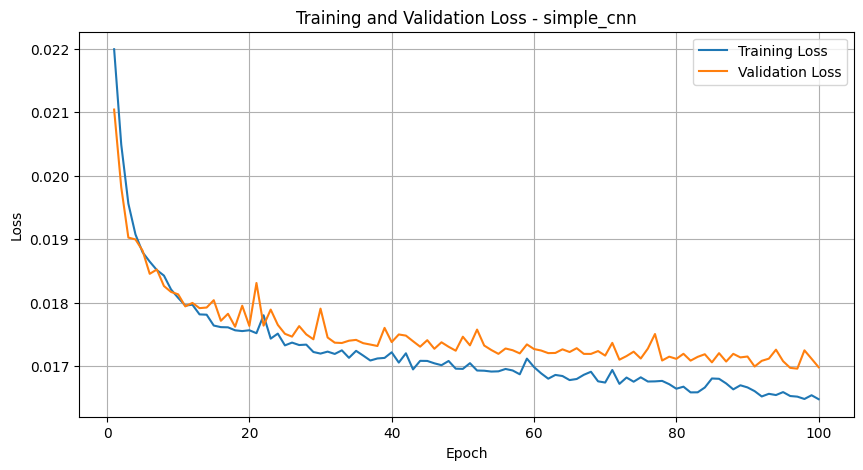

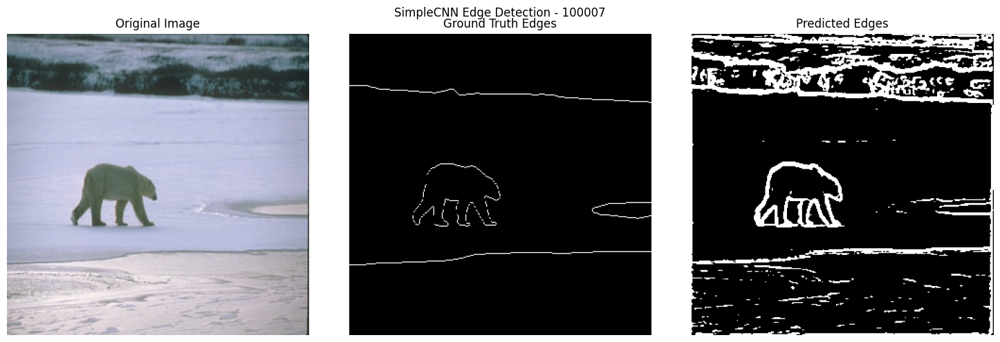

Processed test image 100007


<Figure size 640x480 with 0 Axes>

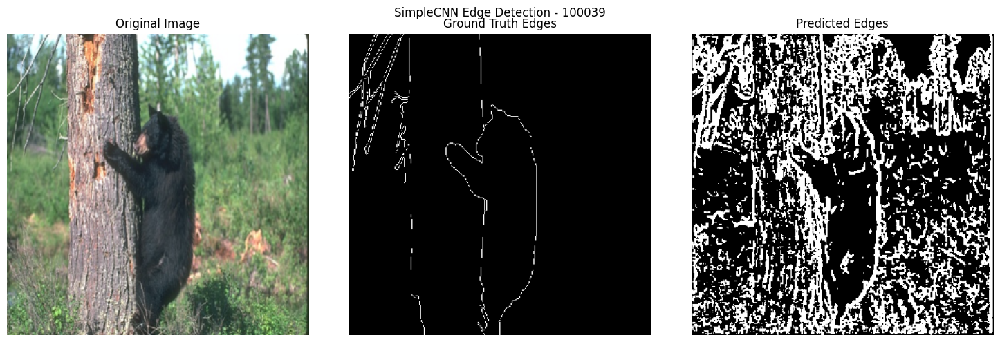

Processed test image 100039


<Figure size 640x480 with 0 Axes>

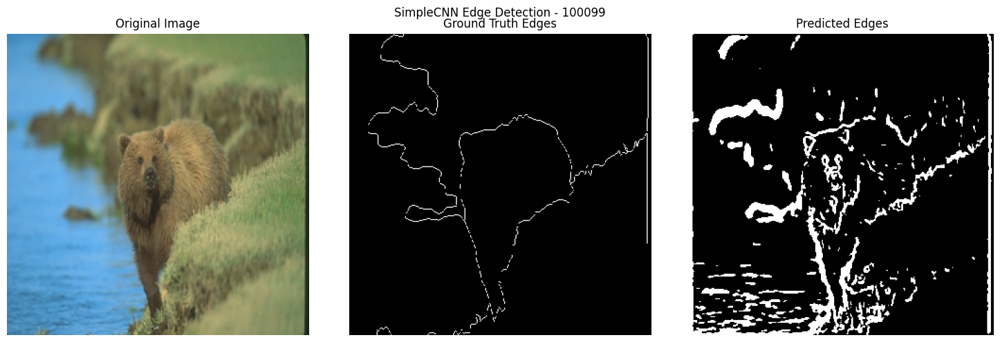

Processed test image 100099


<Figure size 640x480 with 0 Axes>

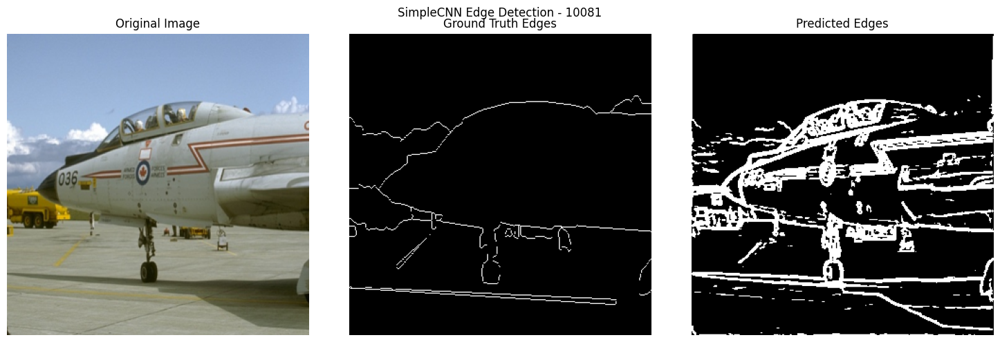

Processed test image 10081


<Figure size 640x480 with 0 Axes>

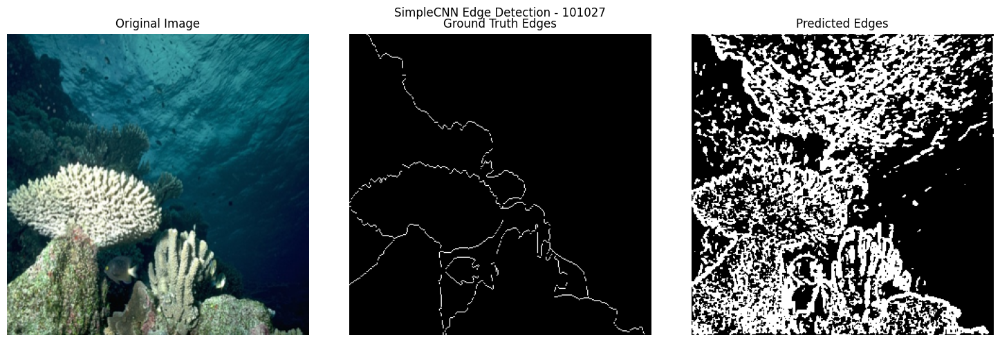

Processed test image 101027
Task 2 completed.
Discussion on loss function:
1. We used class-balanced binary cross entropy loss which addresses the imbalance
   between edge and non-edge pixels (typically ~90% of pixels are non-edges).
2. This loss function assigns higher weights to the minority class (edge pixels)
   and lower weights to the majority class (non-edge pixels).
3. No activation function was used in the output layer during training since
   binary_cross_entropy_with_logits is more numerically stable.
4. For inference, we apply sigmoid to get probabilities and then threshold.


<Figure size 640x480 with 0 Axes>

In [6]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        # Simple 3-layer CNN as specified in the assignment
        # Conv1: Input channels=3 (RGB), Output channels=8, kernel_size=3, padding=1
        self.conv1 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        
        # Conv2: Input channels=8, Output channels=16, kernel_size=3, padding=1
        self.conv2 = nn.Conv2d(8, 16, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        
        # Conv3: Input channels=16, Output channels=1 (edge map), kernel_size=3, padding=1
        self.conv3 = nn.Conv2d(16, 1, kernel_size=3, padding=1)
        # No activation after last layer - we'll apply sigmoid when needed
    
    def forward(self, x):
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        x = self.conv3(x)  # No activation here - will be applied in the loss function
        return x

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, model_name):
    """
    Train the model and validate
    """
    train_losses = []
    val_losses = []
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        
        # Use tqdm for progress bar
        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
            for images, targets, _ in pbar:
                images = images.to(device)
                targets = targets.to(device)
                
                # Zero the gradients
                optimizer.zero_grad()
                
                # Forward pass
                outputs = model(images)
                
                # Calculate loss
                loss = criterion(outputs, targets)
                
                # Backward pass and optimize
                loss.backward()
                optimizer.step()
                
                # Update statistics
                running_loss += loss.item()
                pbar.set_postfix({'loss': loss.item()})
        
        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        
        with torch.no_grad():
            for images, targets, _ in val_loader:
                images = images.to(device)
                targets = targets.to(device)
                
                outputs = model(images)
                loss = criterion(outputs, targets)
                
                val_loss += loss.item()
        
        val_loss = val_loss / len(val_loader)
        val_losses.append(val_loss)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    
    # Save the trained model
    torch.save(model.state_dict(), f"{model_name}.pth")
    
    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Training and Validation Loss - {model_name}')
    plt.legend()
    plt.grid(True)
    plt.savefig(f"{model_name}_loss.png")
    plt.show()
    
    return train_losses, val_losses

def evaluate_model(model, test_loader, threshold=0.5, model_name="Model"):
    """
    Evaluate the model on test data and visualize results
    """
    model.eval()
    
    # Process a few test samples
    with torch.no_grad():
        for i, (images, targets, img_names) in enumerate(test_loader):
            if i >= 5:  # Limit to 5 test images
                break
                
            images = images.to(device)
            targets = targets.to(device)
            
            # Forward pass
            outputs = model(images)
            
            # Apply sigmoid to get probabilities
            probs = torch.sigmoid(outputs)
            
            # Apply threshold to get binary edge map
            pred_edges = (probs > threshold).float()
            
            # Visualize results
            for j in range(images.size(0)):
                img = images[j]
                gt = targets[j]
                pred = pred_edges[j]
                
                fig = visualize_edges(img, gt, pred, 
                                      title=f"{model_name} Edge Detection - {img_names[j]}")
                plt.savefig(f"{model_name}_result_{img_names[j]}.png")
                plt.close(fig)
                
                print(f"Processed test image {img_names[j]}")

def task2_simple_cnn():
    """
    Task 2: Train a simple 3-layer CNN for edge detection
    """
    print("Task 2: Simple CNN Model")
    
    # Set up transforms for loading images
    transform = transforms.Compose([
        transforms.Resize((320, 320)),  # Resize to make it more manageable
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Create datasets
    train_dataset = BSDS500Dataset(TRAIN_IMG_DIR, TRAIN_GT_DIR, transform=transform)
    val_dataset = BSDS500Dataset(VAL_IMG_DIR, VAL_GT_DIR, transform=transform)
    test_dataset = BSDS500Dataset(TEST_IMG_DIR, TEST_GT_DIR, transform=transform)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)
    
    # Initialize model
    model = SimpleCNN().to(device)
    
    # Loss function - using the class balanced cross entropy loss
    criterion = BalancedCrossEntropyLoss()
    
    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    # Train the model
    train_losses, val_losses = train_model(
        model, train_loader, val_loader, criterion, optimizer, 
        num_epochs=100, model_name="simple_cnn"
    )
    
    # Evaluate on test set
    evaluate_model(model, test_loader, threshold=0.5, model_name="SimpleCNN")
    
    print("Task 2 completed.")
    print("Discussion on loss function:")
    print("1. We used class-balanced binary cross entropy loss which addresses the imbalance")
    print("   between edge and non-edge pixels (typically ~90% of pixels are non-edges).")
    print("2. This loss function assigns higher weights to the minority class (edge pixels)")
    print("   and lower weights to the majority class (non-edge pixels).")
    print("3. No activation function was used in the output layer during training since")
    print("   binary_cross_entropy_with_logits is more numerically stable.")
    print("4. For inference, we apply sigmoid to get probabilities and then threshold.")

if __name__ == "__main__":
    task2_simple_cnn()

#### Task 3: VGG16 Model

 The second network we will try is the VGG16 convolutional network. Ensure the images are the right format for the input of VGG16. Import VGG 16 without the last max-pooling layer and the fully connected layers.\
Instead, use a tranpose convolution(transposeConv2Din pytorch) decoder at the end of the network to restore output size to original image size.(How well does only bilinear interpolation upsampling work? Try this out and compare). \
 Train this network like you did in Task 2 (add threshold as required to binarize the output edge map). \
 Use this trained network to plot outputs for the test dataset and compare with ground truth. \
 Use class balanced loss function as above. 

##### VGG16 convolutional network
VGG16 with Transpose Convolution and Bilinear Upsampling


Task 3: VGG16 Model


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 209MB/s] 


Training VGG16 with Transpose Convolution...


Epoch 1/50: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s, loss=0.0179]


Epoch 1/50, Train Loss: 0.0219, Val Loss: 0.0212


Epoch 2/50: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s, loss=0.0187]


Epoch 2/50, Train Loss: 0.0197, Val Loss: 0.0189


Epoch 3/50: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s, loss=0.0212] 


Epoch 3/50, Train Loss: 0.0173, Val Loss: 0.0180


Epoch 4/50: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s, loss=0.0197] 


Epoch 4/50, Train Loss: 0.0156, Val Loss: 0.0205


Epoch 5/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.0148] 


Epoch 5/50, Train Loss: 0.0146, Val Loss: 0.0180


Epoch 6/50: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s, loss=0.0104] 


Epoch 6/50, Train Loss: 0.0135, Val Loss: 0.0196


Epoch 7/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.00802]


Epoch 7/50, Train Loss: 0.0124, Val Loss: 0.0198


Epoch 8/50: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s, loss=0.00843]


Epoch 8/50, Train Loss: 0.0117, Val Loss: 0.0267


Epoch 9/50: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s, loss=0.009]  


Epoch 9/50, Train Loss: 0.0111, Val Loss: 0.0253


Epoch 10/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.00983]


Epoch 10/50, Train Loss: 0.0108, Val Loss: 0.0238


Epoch 11/50: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s, loss=0.00644]


Epoch 11/50, Train Loss: 0.0110, Val Loss: 0.0220


Epoch 12/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.0121] 


Epoch 12/50, Train Loss: 0.0102, Val Loss: 0.0231


Epoch 13/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.0121] 


Epoch 13/50, Train Loss: 0.0098, Val Loss: 0.0330


Epoch 14/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.00784]


Epoch 14/50, Train Loss: 0.0088, Val Loss: 0.0434


Epoch 15/50: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s, loss=0.00956]


Epoch 15/50, Train Loss: 0.0089, Val Loss: 0.0389


Epoch 16/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00932]


Epoch 16/50, Train Loss: 0.0083, Val Loss: 0.0431


Epoch 17/50: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s, loss=0.00623]


Epoch 17/50, Train Loss: 0.0083, Val Loss: 0.0533


Epoch 18/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.00898]


Epoch 18/50, Train Loss: 0.0078, Val Loss: 0.0555


Epoch 19/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00702]


Epoch 19/50, Train Loss: 0.0078, Val Loss: 0.0569


Epoch 20/50: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s, loss=0.00506]


Epoch 20/50, Train Loss: 0.0078, Val Loss: 0.0479


Epoch 21/50: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s, loss=0.00791]


Epoch 21/50, Train Loss: 0.0074, Val Loss: 0.0615


Epoch 22/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.009]  


Epoch 22/50, Train Loss: 0.0071, Val Loss: 0.0698


Epoch 23/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.00617]


Epoch 23/50, Train Loss: 0.0071, Val Loss: 0.0768


Epoch 24/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.00806]


Epoch 24/50, Train Loss: 0.0071, Val Loss: 0.0718


Epoch 25/50: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s, loss=0.0049] 


Epoch 25/50, Train Loss: 0.0084, Val Loss: 0.0462


Epoch 26/50: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s, loss=0.00675]


Epoch 26/50, Train Loss: 0.0085, Val Loss: 0.0300


Epoch 27/50: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s, loss=0.00744]


Epoch 27/50, Train Loss: 0.0072, Val Loss: 0.0559


Epoch 28/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00288]


Epoch 28/50, Train Loss: 0.0066, Val Loss: 0.0782


Epoch 29/50: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s, loss=0.0031] 


Epoch 29/50, Train Loss: 0.0062, Val Loss: 0.1005


Epoch 30/50: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s, loss=0.00504]


Epoch 30/50, Train Loss: 0.0060, Val Loss: 0.1027


Epoch 31/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00542]


Epoch 31/50, Train Loss: 0.0062, Val Loss: 0.0838


Epoch 32/50: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s, loss=0.00263]


Epoch 32/50, Train Loss: 0.0061, Val Loss: 0.1060


Epoch 33/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.00474]


Epoch 33/50, Train Loss: 0.0060, Val Loss: 0.1009


Epoch 34/50: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s, loss=0.00569]


Epoch 34/50, Train Loss: 0.0058, Val Loss: 0.1091


Epoch 35/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00996]


Epoch 35/50, Train Loss: 0.0057, Val Loss: 0.1128


Epoch 36/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.00616]


Epoch 36/50, Train Loss: 0.0058, Val Loss: 0.1082


Epoch 37/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00157]


Epoch 37/50, Train Loss: 0.0057, Val Loss: 0.1134


Epoch 38/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.0058] 


Epoch 38/50, Train Loss: 0.0057, Val Loss: 0.1336


Epoch 39/50: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s, loss=0.0039] 


Epoch 39/50, Train Loss: 0.0058, Val Loss: 0.0951


Epoch 40/50: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s, loss=0.0038] 


Epoch 40/50, Train Loss: 0.0059, Val Loss: 0.0813


Epoch 41/50: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s, loss=0.00831]


Epoch 41/50, Train Loss: 0.0058, Val Loss: 0.0867


Epoch 42/50: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s, loss=0.00426]


Epoch 42/50, Train Loss: 0.0058, Val Loss: 0.1095


Epoch 43/50: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s, loss=0.00258]


Epoch 43/50, Train Loss: 0.0052, Val Loss: 0.1260


Epoch 44/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.00403]


Epoch 44/50, Train Loss: 0.0050, Val Loss: 0.1665


Epoch 45/50: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s, loss=0.00518]


Epoch 45/50, Train Loss: 0.0050, Val Loss: 0.1542


Epoch 46/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.00495]


Epoch 46/50, Train Loss: 0.0049, Val Loss: 0.1479


Epoch 47/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00561]


Epoch 47/50, Train Loss: 0.0051, Val Loss: 0.1335


Epoch 48/50: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s, loss=0.00805]


Epoch 48/50, Train Loss: 0.0051, Val Loss: 0.1273


Epoch 49/50: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s, loss=0.0018] 


Epoch 49/50, Train Loss: 0.0048, Val Loss: 0.1348


Epoch 50/50: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s, loss=0.00647]


Epoch 50/50, Train Loss: 0.0049, Val Loss: 0.1389


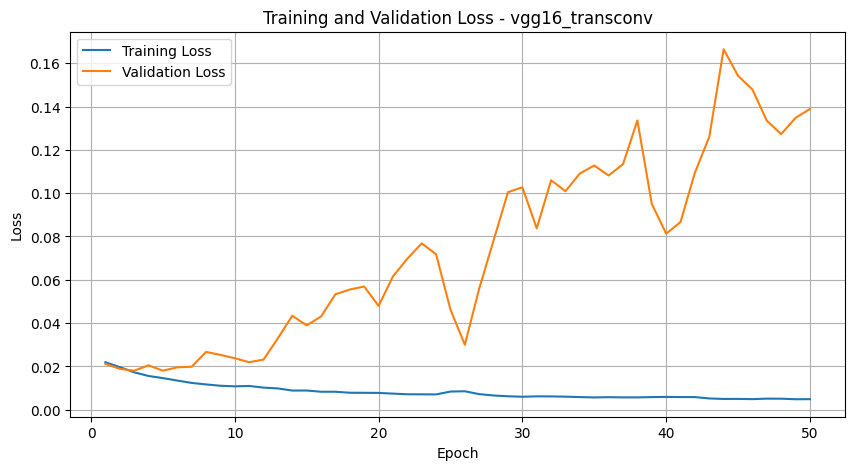

Training VGG16 with Bilinear Upsampling...


Epoch 1/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.0159]


Epoch 1/50, Train Loss: 0.0208, Val Loss: 0.0196


Epoch 2/50: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s, loss=0.0189]


Epoch 2/50, Train Loss: 0.0179, Val Loss: 0.0187


Epoch 3/50: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s, loss=0.0169] 


Epoch 3/50, Train Loss: 0.0163, Val Loss: 0.0184


Epoch 4/50: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s, loss=0.0136] 


Epoch 4/50, Train Loss: 0.0154, Val Loss: 0.0193


Epoch 5/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.0137] 


Epoch 5/50, Train Loss: 0.0145, Val Loss: 0.0186


Epoch 6/50: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s, loss=0.0143] 


Epoch 6/50, Train Loss: 0.0137, Val Loss: 0.0200


Epoch 7/50: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s, loss=0.0155] 


Epoch 7/50, Train Loss: 0.0127, Val Loss: 0.0211


Epoch 8/50: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s, loss=0.0139] 


Epoch 8/50, Train Loss: 0.0122, Val Loss: 0.0236


Epoch 9/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.0152] 


Epoch 9/50, Train Loss: 0.0117, Val Loss: 0.0272


Epoch 10/50: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s, loss=0.00881]


Epoch 10/50, Train Loss: 0.0115, Val Loss: 0.0303


Epoch 11/50: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s, loss=0.0138] 


Epoch 11/50, Train Loss: 0.0114, Val Loss: 0.0275


Epoch 12/50: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s, loss=0.0111] 


Epoch 12/50, Train Loss: 0.0109, Val Loss: 0.0376


Epoch 13/50: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s, loss=0.0118] 


Epoch 13/50, Train Loss: 0.0107, Val Loss: 0.0353


Epoch 14/50: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s, loss=0.0119] 


Epoch 14/50, Train Loss: 0.0105, Val Loss: 0.0389


Epoch 15/50: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s, loss=0.0183] 


Epoch 15/50, Train Loss: 0.0104, Val Loss: 0.0296


Epoch 16/50: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s, loss=0.0149] 


Epoch 16/50, Train Loss: 0.0103, Val Loss: 0.0331


Epoch 17/50: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s, loss=0.00421]


Epoch 17/50, Train Loss: 0.0103, Val Loss: 0.0396


Epoch 18/50: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s, loss=0.0148] 


Epoch 18/50, Train Loss: 0.0101, Val Loss: 0.0481


Epoch 19/50: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s, loss=0.0097] 


Epoch 19/50, Train Loss: 0.0099, Val Loss: 0.0400


Epoch 20/50: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s, loss=0.00851]


Epoch 20/50, Train Loss: 0.0097, Val Loss: 0.0472


Epoch 21/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.0107] 


Epoch 21/50, Train Loss: 0.0098, Val Loss: 0.0455


Epoch 22/50: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s, loss=0.0101] 


Epoch 22/50, Train Loss: 0.0098, Val Loss: 0.0464


Epoch 23/50: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s, loss=0.00938]


Epoch 23/50, Train Loss: 0.0097, Val Loss: 0.0535


Epoch 24/50: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s, loss=0.0115] 


Epoch 24/50, Train Loss: 0.0097, Val Loss: 0.0424


Epoch 25/50: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s, loss=0.00443]


Epoch 25/50, Train Loss: 0.0095, Val Loss: 0.0533


Epoch 26/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.0108] 


Epoch 26/50, Train Loss: 0.0096, Val Loss: 0.0493


Epoch 27/50: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s, loss=0.0054] 


Epoch 27/50, Train Loss: 0.0095, Val Loss: 0.0521


Epoch 28/50: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s, loss=0.0146] 


Epoch 28/50, Train Loss: 0.0095, Val Loss: 0.0589


Epoch 29/50: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s, loss=0.00748]


Epoch 29/50, Train Loss: 0.0094, Val Loss: 0.0528


Epoch 30/50: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s, loss=0.00945]


Epoch 30/50, Train Loss: 0.0093, Val Loss: 0.0600


Epoch 31/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.00673]


Epoch 31/50, Train Loss: 0.0094, Val Loss: 0.0690


Epoch 32/50: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s, loss=0.0135] 


Epoch 32/50, Train Loss: 0.0093, Val Loss: 0.0525


Epoch 33/50: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s, loss=0.0117] 


Epoch 33/50, Train Loss: 0.0094, Val Loss: 0.0507


Epoch 34/50: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s, loss=0.00907]


Epoch 34/50, Train Loss: 0.0094, Val Loss: 0.0538


Epoch 35/50: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s, loss=0.00724]


Epoch 35/50, Train Loss: 0.0096, Val Loss: 0.0468


Epoch 36/50: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s, loss=0.0171] 


Epoch 36/50, Train Loss: 0.0094, Val Loss: 0.0552


Epoch 37/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.00572]


Epoch 37/50, Train Loss: 0.0094, Val Loss: 0.0508


Epoch 38/50: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s, loss=0.0052] 


Epoch 38/50, Train Loss: 0.0093, Val Loss: 0.0524


Epoch 39/50: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s, loss=0.0119] 


Epoch 39/50, Train Loss: 0.0093, Val Loss: 0.0511


Epoch 40/50: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s, loss=0.0114] 


Epoch 40/50, Train Loss: 0.0092, Val Loss: 0.0623


Epoch 41/50: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s, loss=0.00934]


Epoch 41/50, Train Loss: 0.0093, Val Loss: 0.0497


Epoch 42/50: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s, loss=0.00869]


Epoch 42/50, Train Loss: 0.0092, Val Loss: 0.0638


Epoch 43/50: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s, loss=0.00739]


Epoch 43/50, Train Loss: 0.0091, Val Loss: 0.0635


Epoch 44/50: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s, loss=0.0134] 


Epoch 44/50, Train Loss: 0.0092, Val Loss: 0.0538


Epoch 45/50: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s, loss=0.00796]


Epoch 45/50, Train Loss: 0.0092, Val Loss: 0.0615


Epoch 46/50: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s, loss=0.00745]


Epoch 46/50, Train Loss: 0.0091, Val Loss: 0.0637


Epoch 47/50: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s, loss=0.00922]


Epoch 47/50, Train Loss: 0.0092, Val Loss: 0.0748


Epoch 48/50: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s, loss=0.00923]


Epoch 48/50, Train Loss: 0.0092, Val Loss: 0.0712


Epoch 49/50: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s, loss=0.007]  


Epoch 49/50, Train Loss: 0.0091, Val Loss: 0.0668


Epoch 50/50: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s, loss=0.00607]


Epoch 50/50, Train Loss: 0.0091, Val Loss: 0.0698


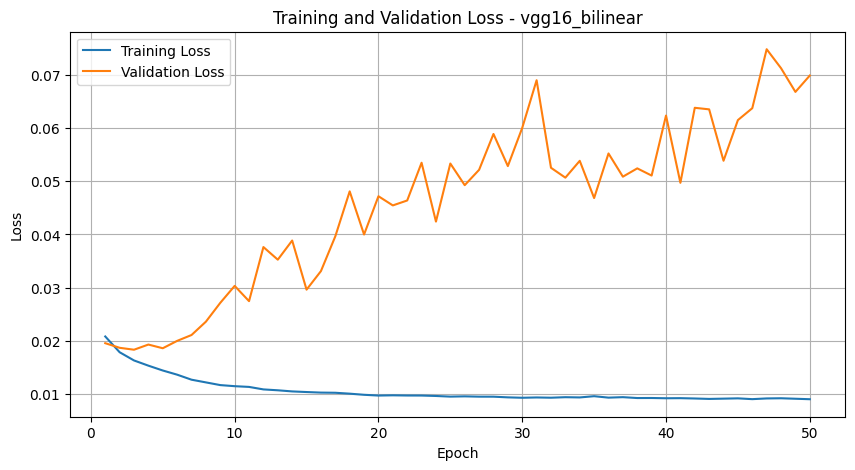

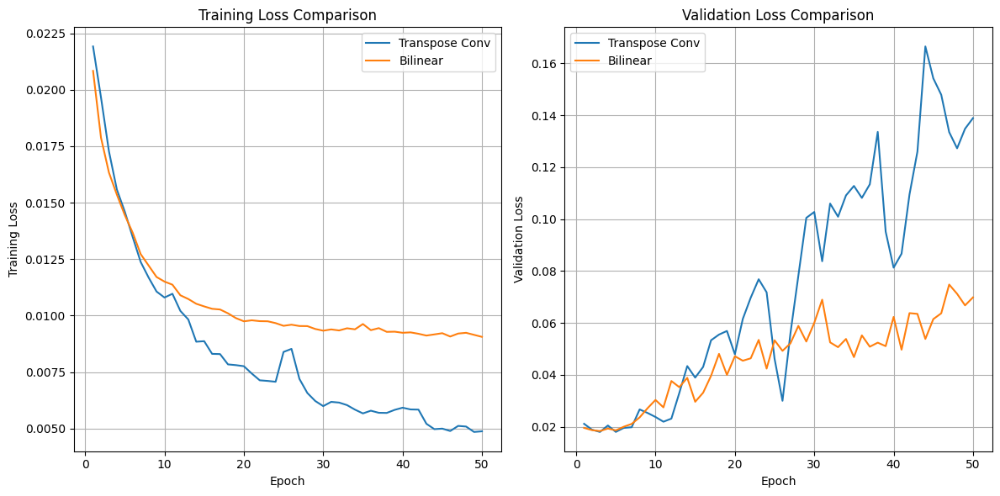

Evaluating VGG16 with Transpose Convolution...


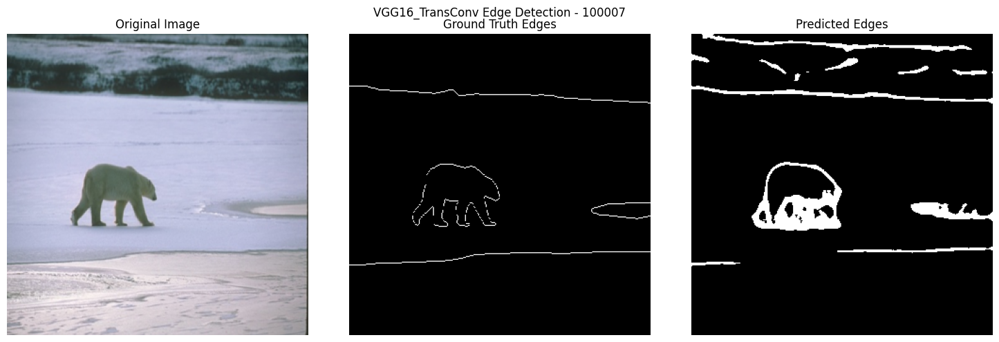

Processed test image 100007


<Figure size 640x480 with 0 Axes>

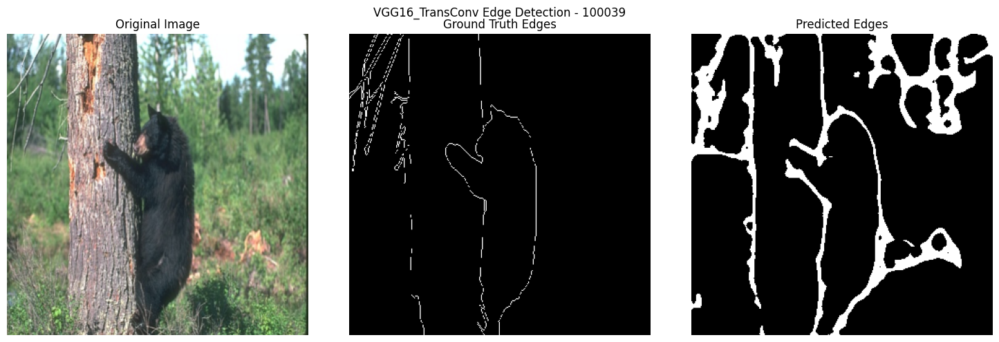

Processed test image 100039


<Figure size 640x480 with 0 Axes>

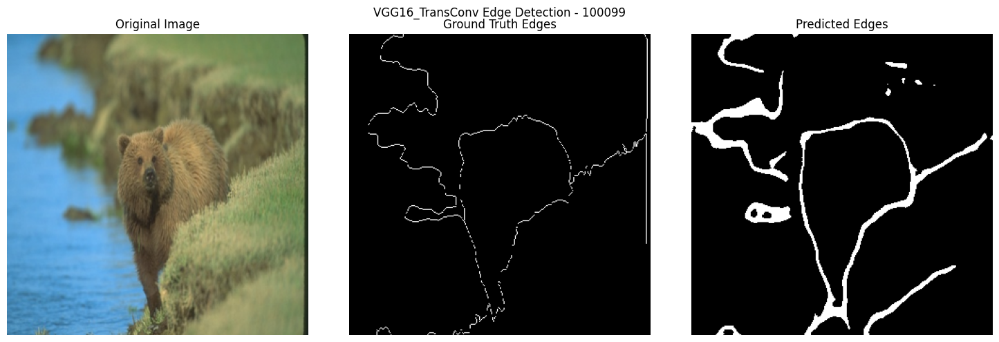

Processed test image 100099


<Figure size 640x480 with 0 Axes>

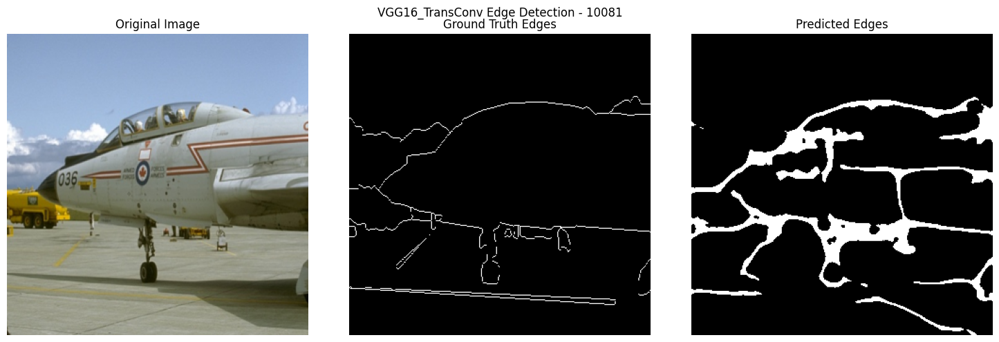

Processed test image 10081


<Figure size 640x480 with 0 Axes>

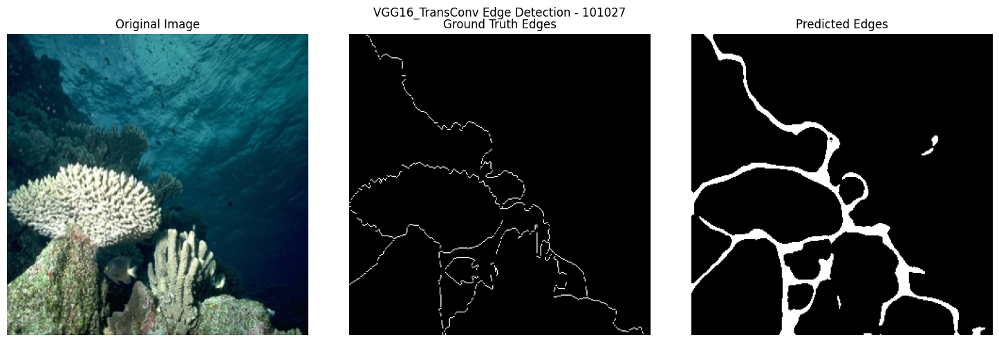

Processed test image 101027
Evaluating VGG16 with Bilinear Upsampling...


<Figure size 640x480 with 0 Axes>

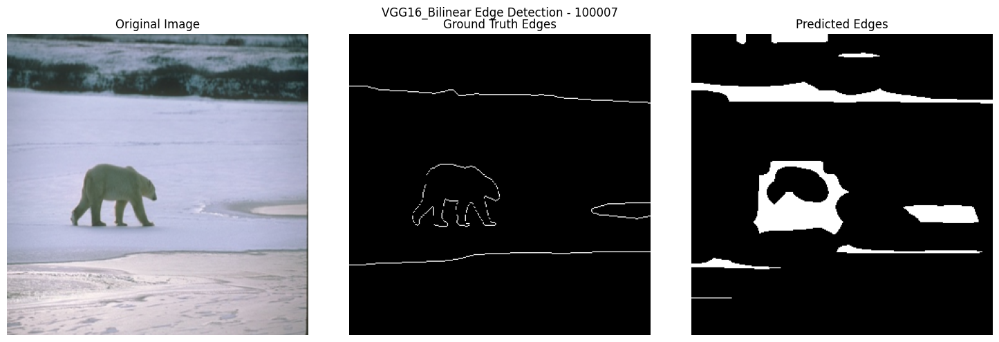

Processed test image 100007


<Figure size 640x480 with 0 Axes>

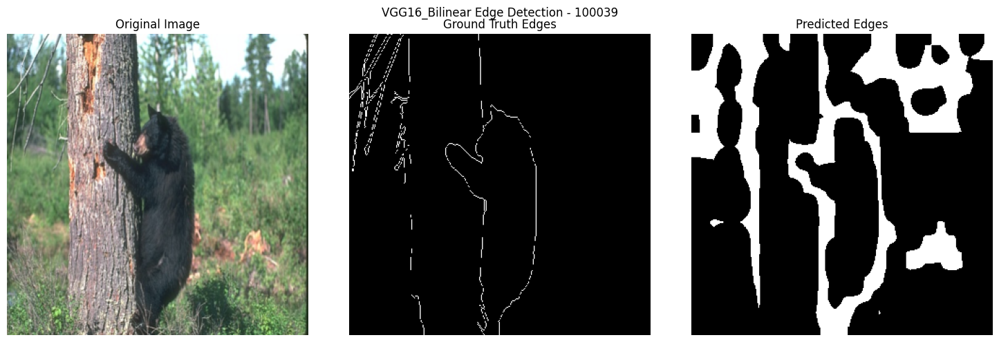

Processed test image 100039


<Figure size 640x480 with 0 Axes>

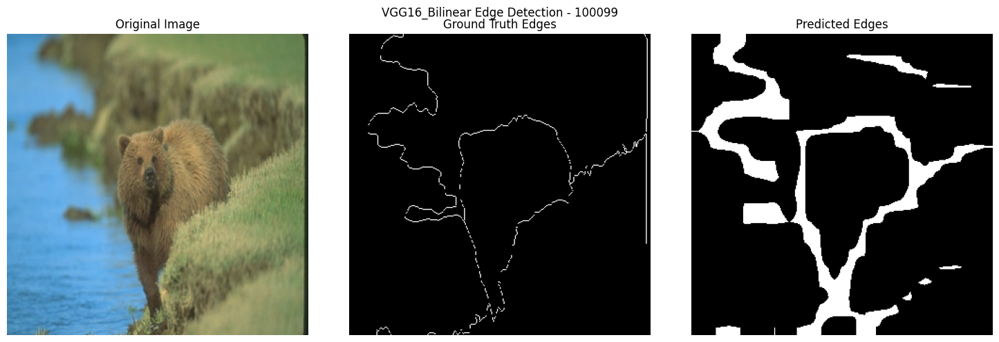

Processed test image 100099


<Figure size 640x480 with 0 Axes>

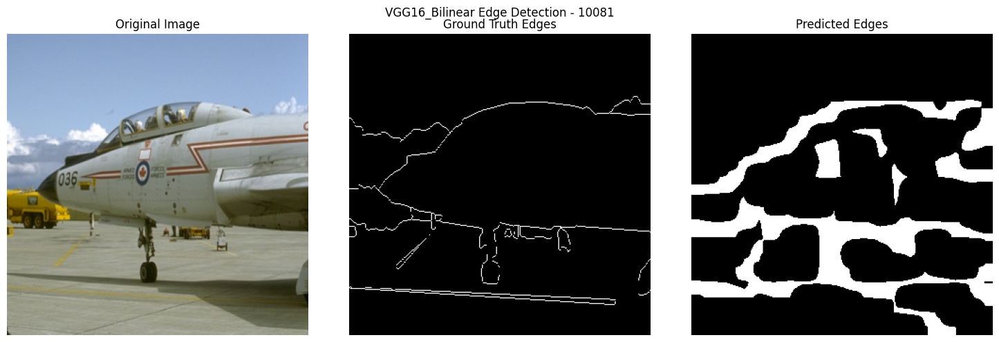

Processed test image 10081


<Figure size 640x480 with 0 Axes>

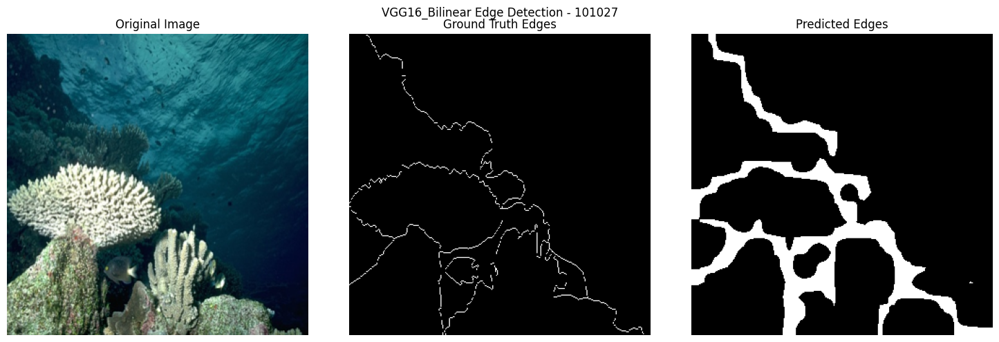

Processed test image 101027
Task 3 completed.
Discussion on VGG16 model:
1. VGG16 uses more complex features from pretrained ImageNet model
2. Transpose convolution vs bilinear upsampling comparison:
   - Transpose convolution is learnable and can capture more details
   - Bilinear upsampling is simpler but may produce smoother edges
3. The class-balanced loss function is still crucial due to edge/non-edge imbalance
4. VGG16 should outperform the simple CNN due to deeper architecture and pretraining


<Figure size 640x480 with 0 Axes>

In [7]:
class VGG16EdgeDetection(nn.Module):
    def __init__(self):
        super(VGG16EdgeDetection, self).__init__()
        
        # Load pretrained VGG16 model without classifier
        vgg16 = models.vgg16(pretrained=True)
        
        # Extract features (without the last max pooling layer)
        self.features = nn.Sequential(*list(vgg16.features.children())[:-1])
        
        # Transpose convolution decoder to restore original image size
        # Input: 512 channels from VGG16 (after dropping last pooling layer)
        # Size is 1/16 of original (due to 4 pooling operations)
        self.decoder = nn.Sequential(
            # First upsampling: 1/16 -> 1/8
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            
            # Second upsampling: 1/8 -> 1/4
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            
            # Third upsampling: 1/4 -> 1/2
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            
            # Fourth upsampling: 1/2 -> 1
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            
            # Final convolution to get single channel
            nn.Conv2d(32, 1, kernel_size=3, padding=1)
        )
    
    def forward(self, x):
        # Get original dimensions for later upsampling
        _, _, h, w = x.size()
        
        # Extract features using VGG16
        x = self.features(x)
        
        # Decode using transpose convolution
        x = self.decoder(x)
        
        return x

class VGG16BilinearEdgeDetection(nn.Module):
    def __init__(self):
        super(VGG16BilinearEdgeDetection, self).__init__()
        
        # Load pretrained VGG16 model without classifier
        vgg16 = models.vgg16(pretrained=True)
        
        # Extract features (without the last max pooling layer)
        self.features = nn.Sequential(*list(vgg16.features.children())[:-1])
        
        # Simple decoder with bilinear upsampling
        self.decoder = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 1, kernel_size=3, padding=1)
        )
    
    def forward(self, x):
        # Get original dimensions for later upsampling
        _, _, h, w = x.size()
        
        # Extract features using VGG16
        x = self.features(x)
        
        # Apply convolutions
        x = self.decoder(x)
        
        # Bilinear upsampling to match original image size
        x = nn.functional.interpolate(x, size=(h, w), mode='bilinear', align_corners=False)
        
        return x

def task3_vgg16_model():
    """
    Task 3: Train VGG16-based models for edge detection
    """
    print("Task 3: VGG16 Model")
    
    # Set up transforms for loading images
    transform = transforms.Compose([
        transforms.Resize((320, 320)),  
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Create datasets
    train_dataset = BSDS500Dataset(TRAIN_IMG_DIR, TRAIN_GT_DIR, transform=transform)
    val_dataset = BSDS500Dataset(VAL_IMG_DIR, VAL_GT_DIR, transform=transform)
    test_dataset = BSDS500Dataset(TEST_IMG_DIR, TEST_GT_DIR, transform=transform)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)
    
    # Initialize models
    vgg_transconv_model = VGG16EdgeDetection().to(device)
    vgg_bilinear_model = VGG16BilinearEdgeDetection().to(device)
    
    # Loss function - using the class balanced cross entropy loss
    criterion = BalancedCrossEntropyLoss()
    
    # Optimizer
    optimizer_transconv = optim.Adam(vgg_transconv_model.parameters(), lr=0.0001)
    optimizer_bilinear = optim.Adam(vgg_bilinear_model.parameters(), lr=0.0001)
    
    # Train the models
    print("Training VGG16 with Transpose Convolution...")
    train_losses_transconv, val_losses_transconv = train_model(
        vgg_transconv_model, train_loader, val_loader, criterion, optimizer_transconv, 
        num_epochs=50, model_name="vgg16_transconv"
    )
    
    print("Training VGG16 with Bilinear Upsampling...")
    train_losses_bilinear, val_losses_bilinear = train_model(
        vgg_bilinear_model, train_loader, val_loader, criterion, optimizer_bilinear, 
        num_epochs=50, model_name="vgg16_bilinear"
    )
    
    # Compare loss curves
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_losses_transconv)+1), train_losses_transconv, label='Transpose Conv')
    plt.plot(range(1, len(train_losses_bilinear)+1), train_losses_bilinear, label='Bilinear')
    plt.xlabel('Epoch')
    plt.ylabel('Training Loss')
    plt.title('Training Loss Comparison')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(val_losses_transconv)+1), val_losses_transconv, label='Transpose Conv')
    plt.plot(range(1, len(val_losses_bilinear)+1), val_losses_bilinear, label='Bilinear')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Loss')
    plt.title('Validation Loss Comparison')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig("vgg16_loss_comparison.png")
    plt.show()
    
    # Evaluate on test set
    print("Evaluating VGG16 with Transpose Convolution...")
    evaluate_model(vgg_transconv_model, test_loader, threshold=0.5, model_name="VGG16_TransConv")
    
    print("Evaluating VGG16 with Bilinear Upsampling...")
    evaluate_model(vgg_bilinear_model, test_loader, threshold=0.5, model_name="VGG16_Bilinear")
    
    print("Task 3 completed.")
    print("Discussion on VGG16 model:")
    print("1. VGG16 uses more complex features from pretrained ImageNet model")
    print("2. Transpose convolution vs bilinear upsampling comparison:")
    print("   - Transpose convolution is learnable and can capture more details")
    print("   - Bilinear upsampling is simpler but may produce smoother edges")
    print("3. The class-balanced loss function is still crucial due to edge/non-edge imbalance")
    print("4. VGG16 should outperform the simple CNN due to deeper architecture and pretraining")

if __name__ == "__main__":
    task3_vgg16_model()

#### Task 4 Holistically Nested Edge Detection

 We now implement a model similar to the state-of-the-art HED model for edge-detection.
 For this task, download the pre-trained VGG without the fully connected layer and the final
 max-pooling layer.
 Before each pooling layer of the VGG model, extract a side-output. Upsample (using sim
ple bilinear upsampling to original size) the side outputs and fuse them with appropriate
 weights. These weights are also parameters learned during training.
 For the loss function refer to Section 2.2 of the HED paper and apply a loss function as
 described. Describe what you used in your report. Train the network for 50 epochs.
 Visualize your output for a train image after appropriate thresholding to binarize the output.

Task 4: Holistically Nested Edge Detection


Epoch 1/50: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s, loss=0.123] 


Epoch 1/50, Train Loss: 0.1215, Val Loss: 0.1165


Epoch 2/50: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s, loss=0.0928]


Epoch 2/50, Train Loss: 0.1111, Val Loss: 0.1128


Epoch 3/50: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s, loss=0.1]   


Epoch 3/50, Train Loss: 0.1062, Val Loss: 0.1097


Epoch 4/50: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s, loss=0.0638]


Epoch 4/50, Train Loss: 0.1019, Val Loss: 0.1092


Epoch 5/50: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s, loss=0.106] 


Epoch 5/50, Train Loss: 0.0994, Val Loss: 0.1089


Epoch 6/50: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s, loss=0.117] 


Epoch 6/50, Train Loss: 0.0979, Val Loss: 0.1078


Epoch 7/50: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s, loss=0.119] 


Epoch 7/50, Train Loss: 0.0947, Val Loss: 0.1071


Epoch 8/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0588]


Epoch 8/50, Train Loss: 0.0928, Val Loss: 0.1186


Epoch 9/50: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s, loss=0.111] 


Epoch 9/50, Train Loss: 0.0919, Val Loss: 0.1075


Epoch 10/50: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s, loss=0.0985]


Epoch 10/50, Train Loss: 0.0906, Val Loss: 0.1074


Epoch 11/50: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s, loss=0.081] 


Epoch 11/50, Train Loss: 0.0881, Val Loss: 0.1154


Epoch 12/50: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s, loss=0.0867]


Epoch 12/50, Train Loss: 0.0886, Val Loss: 0.1045


Epoch 13/50: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s, loss=0.139] 


Epoch 13/50, Train Loss: 0.0921, Val Loss: 0.1089


Epoch 14/50: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s, loss=0.125] 


Epoch 14/50, Train Loss: 0.0867, Val Loss: 0.1075


Epoch 15/50: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s, loss=0.0764]


Epoch 15/50, Train Loss: 0.0854, Val Loss: 0.1191


Epoch 16/50: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s, loss=0.134] 


Epoch 16/50, Train Loss: 0.0842, Val Loss: 0.1318


Epoch 17/50: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s, loss=0.0712]


Epoch 17/50, Train Loss: 0.0836, Val Loss: 0.1196


Epoch 18/50: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s, loss=0.101] 


Epoch 18/50, Train Loss: 0.0833, Val Loss: 0.1151


Epoch 19/50: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s, loss=0.0659]


Epoch 19/50, Train Loss: 0.0824, Val Loss: 0.1091


Epoch 20/50: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s, loss=0.103] 


Epoch 20/50, Train Loss: 0.0809, Val Loss: 0.1254


Epoch 21/50: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s, loss=0.0965]


Epoch 21/50, Train Loss: 0.0800, Val Loss: 0.1295


Epoch 22/50: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s, loss=0.0795]


Epoch 22/50, Train Loss: 0.0814, Val Loss: 0.1234


Epoch 23/50: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s, loss=0.09]  


Epoch 23/50, Train Loss: 0.0804, Val Loss: 0.1168


Epoch 24/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0795]


Epoch 24/50, Train Loss: 0.0800, Val Loss: 0.1301


Epoch 25/50: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s, loss=0.0795]


Epoch 25/50, Train Loss: 0.0782, Val Loss: 0.1370


Epoch 26/50: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s, loss=0.0967]


Epoch 26/50, Train Loss: 0.0775, Val Loss: 0.1117


Epoch 27/50: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s, loss=0.0789]


Epoch 27/50, Train Loss: 0.0779, Val Loss: 0.1352


Epoch 28/50: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s, loss=0.0507]


Epoch 28/50, Train Loss: 0.0762, Val Loss: 0.1226


Epoch 29/50: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s, loss=0.0869]


Epoch 29/50, Train Loss: 0.0759, Val Loss: 0.1269


Epoch 30/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.123] 


Epoch 30/50, Train Loss: 0.0765, Val Loss: 0.1241


Epoch 31/50: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s, loss=0.119] 


Epoch 31/50, Train Loss: 0.0761, Val Loss: 0.1693


Epoch 32/50: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s, loss=0.0784]


Epoch 32/50, Train Loss: 0.0769, Val Loss: 0.1328


Epoch 33/50: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s, loss=0.0745]


Epoch 33/50, Train Loss: 0.0760, Val Loss: 0.1034


Epoch 34/50: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s, loss=0.11]  


Epoch 34/50, Train Loss: 0.0780, Val Loss: 0.1174


Epoch 35/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0619]


Epoch 35/50, Train Loss: 0.0747, Val Loss: 0.1436


Epoch 36/50: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s, loss=0.0411]


Epoch 36/50, Train Loss: 0.0745, Val Loss: 0.1243


Epoch 37/50: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s, loss=0.0682]


Epoch 37/50, Train Loss: 0.0727, Val Loss: 0.1189


Epoch 38/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0694]


Epoch 38/50, Train Loss: 0.0724, Val Loss: 0.1330


Epoch 39/50: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s, loss=0.0563]


Epoch 39/50, Train Loss: 0.0721, Val Loss: 0.1447


Epoch 40/50: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s, loss=0.0595]


Epoch 40/50, Train Loss: 0.0721, Val Loss: 0.1294


Epoch 41/50: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s, loss=0.0586]


Epoch 41/50, Train Loss: 0.0731, Val Loss: 0.1385


Epoch 42/50: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s, loss=0.0389]


Epoch 42/50, Train Loss: 0.0721, Val Loss: 0.1385


Epoch 43/50: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s, loss=0.069] 


Epoch 43/50, Train Loss: 0.0717, Val Loss: 0.1382


Epoch 44/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0617]


Epoch 44/50, Train Loss: 0.0708, Val Loss: 0.1615


Epoch 45/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0692]


Epoch 45/50, Train Loss: 0.0715, Val Loss: 0.1302


Epoch 46/50: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s, loss=0.0881]


Epoch 46/50, Train Loss: 0.0794, Val Loss: 0.1366


Epoch 47/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0488]


Epoch 47/50, Train Loss: 0.0768, Val Loss: 0.1331


Epoch 48/50: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s, loss=0.0431]


Epoch 48/50, Train Loss: 0.0745, Val Loss: 0.1397


Epoch 49/50: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s, loss=0.1]   


Epoch 49/50, Train Loss: 0.0722, Val Loss: 0.1524


Epoch 50/50: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s, loss=0.0764]


Epoch 50/50, Train Loss: 0.0712, Val Loss: 0.1633


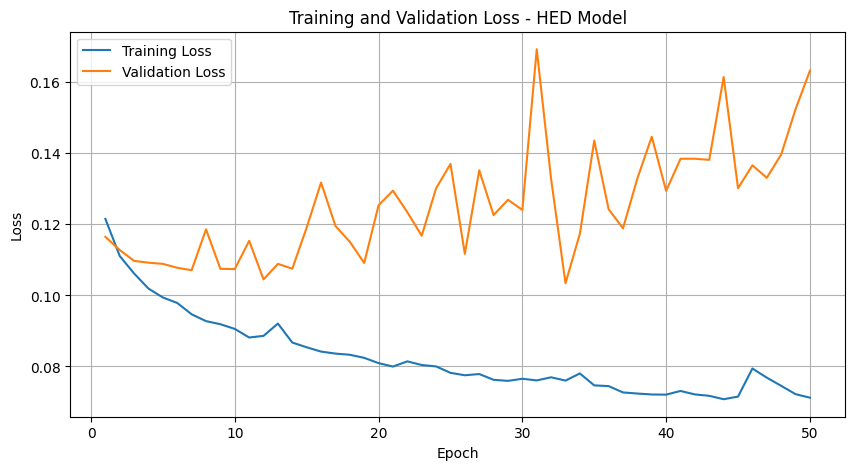

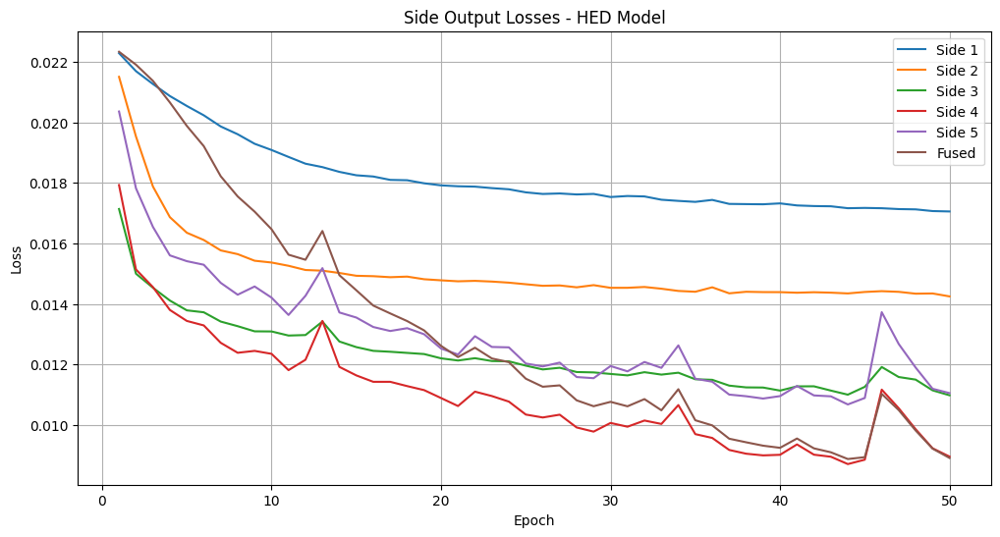

Learned fusion weights:
Side 1: 0.2163
Side 2: 0.1793
Side 3: 0.1665
Side 4: 0.1786
Side 5: 0.1784


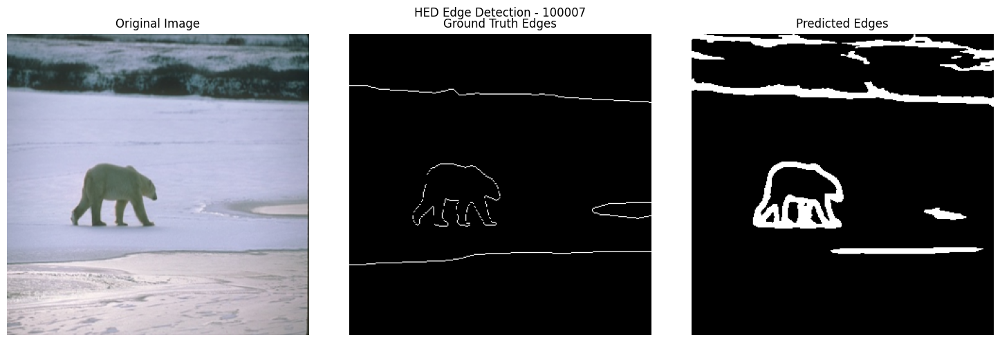

Processed test image 100007


<Figure size 640x480 with 0 Axes>

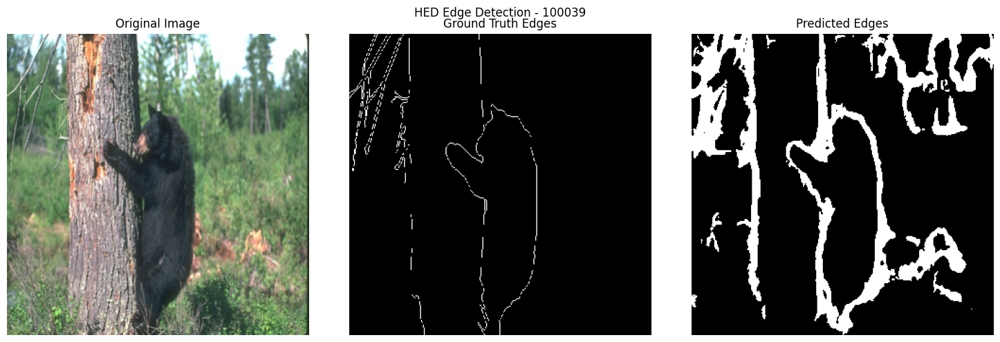

Processed test image 100039


<Figure size 640x480 with 0 Axes>

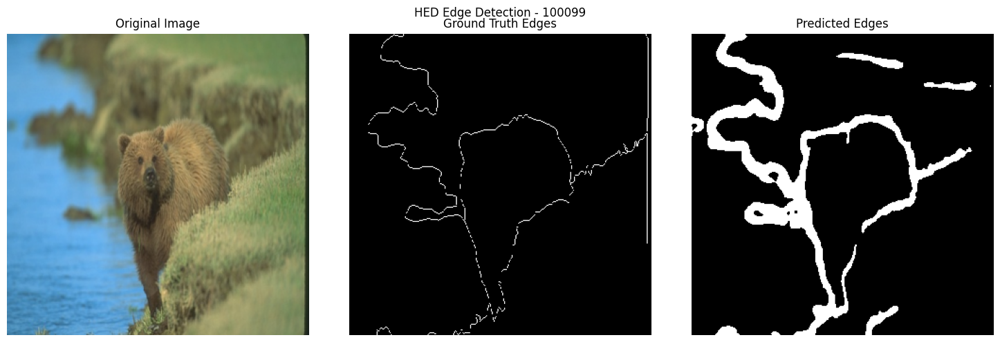

Processed test image 100099


<Figure size 640x480 with 0 Axes>

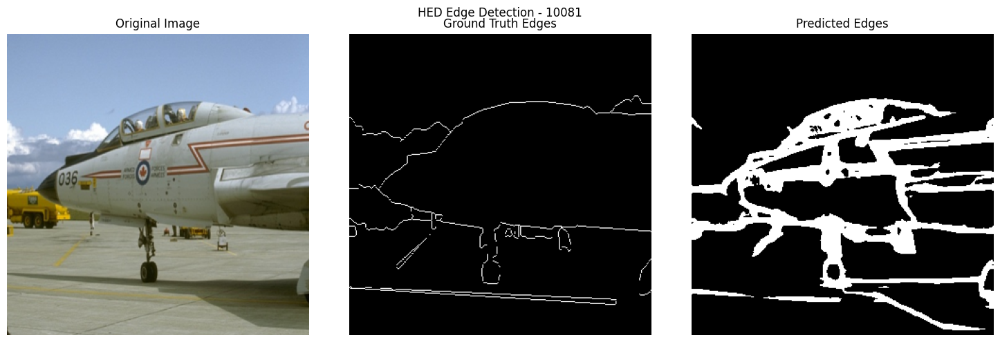

Processed test image 10081


<Figure size 640x480 with 0 Axes>

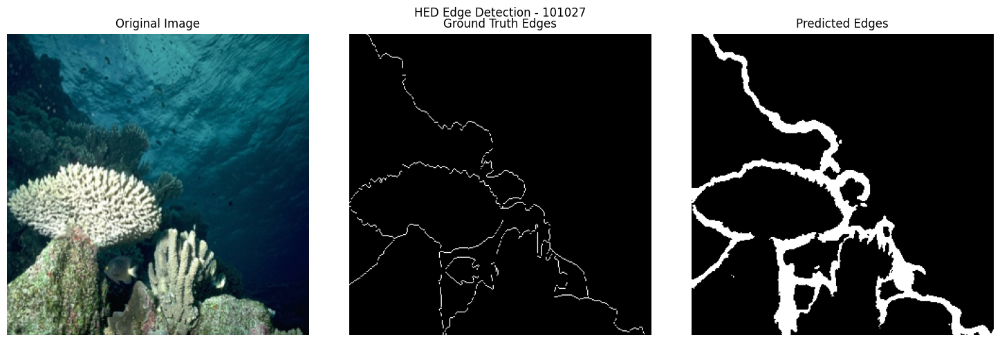

Processed test image 101027
Task 4 completed.
Discussion on HED model:
1. HED leverages multi-scale feature learning with side outputs from different VGG stages
2. Deep supervision with side outputs allows each layer to learn edge features
3. The fusion layer learns to weight the contribution of each side output
4. Side outputs from earlier layers capture fine details while deeper layers capture semantics
5. HED should outperform both simple CNN and VGG16 for detecting perceptually important edges
6. Comparison to Canny:
   - HED detects semantically meaningful edges while Canny detects all intensity changes
   - HED is more robust to texture and noise due to learning from human annotations
   - HED requires no parameter tuning compared to Canny's threshold selection


<Figure size 640x480 with 0 Axes>

In [8]:
class HEDModel(nn.Module):
    def __init__(self):
        super(HEDModel, self).__init__()
        
        # Load pretrained VGG16 features
        vgg16 = models.vgg16(pretrained=True)
        features = list(vgg16.features.children())
        
        # Extract VGG layers before each pooling
        # VGG16 structure: 2 convs -> pool -> 2 convs -> pool -> 3 convs -> pool -> 3 convs -> pool -> 3 convs
        
        # First stage: conv1_1, conv1_2
        self.stage1 = nn.Sequential(*features[:4])
        
        # Second stage: conv2_1, conv2_2
        self.stage2 = nn.Sequential(*features[4:9])
        
        # Third stage: conv3_1, conv3_2, conv3_3
        self.stage3 = nn.Sequential(*features[9:16])
        
        # Fourth stage: conv4_1, conv4_2, conv4_3
        self.stage4 = nn.Sequential(*features[16:23])
        
        # Fifth stage: conv5_1, conv5_2, conv5_3 (without the final max pooling)
        self.stage5 = nn.Sequential(*features[23:30])
        
        # Side output layers
        self.side1 = nn.Conv2d(64, 1, kernel_size=1)
        self.side2 = nn.Conv2d(128, 1, kernel_size=1)
        self.side3 = nn.Conv2d(256, 1, kernel_size=1)
        self.side4 = nn.Conv2d(512, 1, kernel_size=1)
        self.side5 = nn.Conv2d(512, 1, kernel_size=1)
        
        # Fusion layer
        self.fuse = nn.Conv2d(5, 1, kernel_size=1)
        
        # Initialize weights for side outputs and fusion
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in [self.side1, self.side2, self.side3, self.side4, self.side5, self.fuse]:
            nn.init.normal_(m.weight, std=0.01)
            nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        # Store original dimensions
        _, _, h, w = x.size()
        
        # Forward through VGG stages
        stage1_out = self.stage1(x)
        stage2_out = self.stage2(stage1_out)
        stage3_out = self.stage3(stage2_out)
        stage4_out = self.stage4(stage3_out)
        stage5_out = self.stage5(stage4_out)
        
        # Side outputs
        side1 = self.side1(stage1_out)
        side2 = self.side2(stage2_out)
        side3 = self.side3(stage3_out)
        side4 = self.side4(stage4_out)
        side5 = self.side5(stage5_out)
        
        # Upsample side outputs to match original image size
        side1 = nn.functional.interpolate(side1, size=(h, w), mode='bilinear', align_corners=False)
        side2 = nn.functional.interpolate(side2, size=(h, w), mode='bilinear', align_corners=False)
        side3 = nn.functional.interpolate(side3, size=(h, w), mode='bilinear', align_corners=False)
        side4 = nn.functional.interpolate(side4, size=(h, w), mode='bilinear', align_corners=False)
        side5 = nn.functional.interpolate(side5, size=(h, w), mode='bilinear', align_corners=False)
        
        # Concatenate all side outputs
        fuse_input = torch.cat((side1, side2, side3, side4, side5), dim=1)
        
        # Fuse side outputs
        fuse = self.fuse(fuse_input)
        
        # Group all outputs for loss computation
        outputs = [side1, side2, side3, side4, side5, fuse]
        
        return outputs

class HEDLoss(nn.Module):
    """
    Loss function for HED as described in the paper
    Computes loss for each side output and the fused output
    """
    def __init__(self):
        super(HEDLoss, self).__init__()
        self.balanced_ce = BalancedCrossEntropyLoss()
    
    def forward(self, outputs, target):
        """
        Args:
            outputs: List of 6 tensors [side1, side2, side3, side4, side5, fuse]
            target: Ground truth edge map
        """
        losses = []
        
        # Compute loss for each side output and the fused output
        for output in outputs:
            losses.append(self.balanced_ce(output, target))
        
        # Total loss is the sum of all losses
        total_loss = sum(losses)
        
        return total_loss, losses

def train_hed_model(model, train_loader, val_loader, criterion, optimizer, num_epochs):
    """
    Train the HED model and validate
    """
    train_losses = []
    val_losses = []
    side_losses = [[] for _ in range(6)]  # To track individual side output losses
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        running_side_losses = [0.0 for _ in range(6)]
        
        # Use tqdm for progress bar
        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
            for images, targets, _ in pbar:
                images = images.to(device)
                targets = targets.to(device)
                
                # Zero the gradients
                optimizer.zero_grad()
                
                # Forward pass
                outputs = model(images)
                
                # Calculate loss
                loss, individual_losses = criterion(outputs, targets)
                
                # Backward pass and optimize
                loss.backward()
                optimizer.step()
                
                # Update statistics
                running_loss += loss.item()
                for i, ind_loss in enumerate(individual_losses):
                    running_side_losses[i] += ind_loss.item()
                
                pbar.set_postfix({'loss': loss.item()})
        
        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        
        for i in range(6):
            side_loss = running_side_losses[i] / len(train_loader)
            side_losses[i].append(side_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        
        with torch.no_grad():
            for images, targets, _ in val_loader:
                images = images.to(device)
                targets = targets.to(device)
                
                outputs = model(images)
                loss, _ = criterion(outputs, targets)
                
                val_loss += loss.item()
        
        val_loss = val_loss / len(val_loader)
        val_losses.append(val_loss)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    
    # Save the trained model
    torch.save(model.state_dict(), "hed_model.pth")
    
    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss - HED Model')
    plt.legend()
    plt.grid(True)
    plt.savefig("hed_model_loss.png")
    plt.show()
    
    # Plot side output losses
    plt.figure(figsize=(12, 6))
    for i in range(6):
        label = f"Side {i+1}" if i < 5 else "Fused"
        plt.plot(range(1, num_epochs+1), side_losses[i], label=label)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Side Output Losses - HED Model')
    plt.legend()
    plt.grid(True)
    plt.savefig("hed_side_output_losses.png")
    plt.show()
    
    return train_losses, val_losses, side_losses

def evaluate_hed_model(model, test_loader, threshold=0.5):
    """
    Evaluate the HED model on test data and visualize results
    """
    model.eval()
    
    # Get fusion layer weights for visualization
    fusion_weights = model.fuse.weight.data.cpu().numpy().squeeze()
    
    # Print the learned weights
    print("Learned fusion weights:")
    for i, weight in enumerate(fusion_weights):
        if i < 5:  # Individual weights for each side output
            print(f"Side {i+1}: {weight.mean():.4f}")
    
    # Process test samples
    with torch.no_grad():
        for i, (images, targets, img_names) in enumerate(test_loader):
            if i >= 5:  # Limit to 5 test images
                break
                
            images = images.to(device)
            targets = targets.to(device)
            
            # Forward pass
            outputs = model(images)
            
            # Get side outputs and fused output
            side_outputs = outputs[:5]
            fused_output = outputs[5]
            
            # Apply sigmoid to get probabilities
            side_probs = [torch.sigmoid(output) for output in side_outputs]
            fused_prob = torch.sigmoid(fused_output)
            
            # Apply threshold to get binary edge maps
            side_edges = [(prob > threshold).float() for prob in side_probs]
            fused_edges = (fused_prob > threshold).float()
            
            # Visualize results for each image
            for j in range(images.size(0)):
                img = images[j]
                gt = targets[j]
                
                # Plot original image, ground truth and final fusion
                fig = visualize_edges(img, gt, fused_edges[j], 
                                     title=f"HED Edge Detection - {img_names[j]}")
                plt.savefig(f"hed_result_{img_names[j]}.png")
                plt.close(fig)
                
                # Plot side outputs
                fig, axes = plt.subplots(2, 3, figsize=(15, 10))
                
                # Plot side outputs
                for k, side_edge in enumerate(side_edges):
                    row, col = k // 3, k % 3
                    axes[row, col].imshow(side_edge[j].squeeze().cpu().numpy(), cmap='gray')
                    axes[row, col].set_title(f"Side Output {k+1}")
                    axes[row, col].axis('off')
                
                # Plot fused output
                axes[1, 2].imshow(fused_edges[j].squeeze().cpu().numpy(), cmap='gray')
                axes[1, 2].set_title("Fused Output")
                axes[1, 2].axis('off')
                
                plt.suptitle(f"HED Side Outputs - {img_names[j]}")
                plt.tight_layout()
                plt.savefig(f"hed_side_outputs_{img_names[j]}.png")
                plt.close(fig)
                
                print(f"Processed test image {img_names[j]}")

def task4_hed_model():
    """
    Task 4: Implement Holistically Nested Edge Detection (HED)
    """
    print("Task 4: Holistically Nested Edge Detection")
    
    # Set up transforms for loading images
    transform = transforms.Compose([
        transforms.Resize((320, 320)), 
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Create datasets
    train_dataset = BSDS500Dataset(TRAIN_IMG_DIR, TRAIN_GT_DIR, transform=transform)
    val_dataset = BSDS500Dataset(VAL_IMG_DIR, VAL_GT_DIR, transform=transform)
    test_dataset = BSDS500Dataset(TEST_IMG_DIR, TEST_GT_DIR, transform=transform)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)
    
    # Initialize model
    model = HEDModel().to(device)
    
    # Loss function
    criterion = HEDLoss()
    
    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
    
    # Train the model
    train_losses, val_losses, side_losses = train_hed_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=50
    )
    
    # Evaluate on test set
    evaluate_hed_model(model, test_loader, threshold=0.5)
    
    print("Task 4 completed.")
    print("Discussion on HED model:")
    print("1. HED leverages multi-scale feature learning with side outputs from different VGG stages")
    print("2. Deep supervision with side outputs allows each layer to learn edge features")
    print("3. The fusion layer learns to weight the contribution of each side output")
    print("4. Side outputs from earlier layers capture fine details while deeper layers capture semantics")
    print("5. HED should outperform both simple CNN and VGG16 for detecting perceptually important edges")
    print("6. Comparison to Canny:")
    print("   - HED detects semantically meaningful edges while Canny detects all intensity changes")
    print("   - HED is more robust to texture and noise due to learning from human annotations")
    print("   - HED requires no parameter tuning compared to Canny's threshold selection")

if __name__ == "__main__":
    task4_hed_model()